# 10. Geopandas

Geopandas enables the use and manipulation of geospatial data in Python. It extends the common datatype used in pandas to allow for the many and unique geometric operations: GeoSeries and GeoDataFrame. Geopandas is also built on top of shapely for its geometric operation; its underlying datatype allows Geopandas to run blazingly fast and is appropriate for many machine learning pipelines that require large geospatial datasets.

### Instalation 

Following steps:

#### 1. create new environment

conda creare -name new_env

#### 2. Activate new environment
conda activate new_env

#### 3. Install package 

conda install -c conda-forge python=3 geopandas

### Geopandas data types

Shapefile (.shp): vector data that stores geospatial information such as topology, shape geometry, coordinate etc

GeoJSON (.geojson): geospatial information and relevant characteristics (object or string)

Finally, Geopandas creates an additional geometry column

![](../../img/geopandas.png)

### Coordinate Reference Systems (crs)

The coordinate reference systems tell us how GeodataFrame o GeoSeries relate to places on Earth

#### relevant operations: setting a projection and re-projecting 

setting projection: geopandas.read_file() most of time includes projection information. Check using "Geoseries.crs"
If GeoDataframe does not include projection, hence use data["geometry"].set_crs(epsg=4326) for WGS-84.

### WGS-84: 
The Global Positioning System uses the World Geodetic System (WGS84) as its reference coordinate system. It's made up of a reference ellipsoid, a standard coordinate system, altitude data, and a geoid

### Reprojecting:

In somes cases, due to distortions in bidimensional plane and your application of geospatial data, re-projection is required. 

A commonly used default is Universal Transverse Mercator (UTM)







In [2]:
import pandas as pd
from pandas import Series, DataFrame
import numpy as np
import matplotlib.pyplot as plt 
import chardet
import geopandas as gpd
from geopandas import GeoSeries
from shapely.geometry import Point, LineString
import folium 
from folium import Marker, GeoJson
from folium.plugins import MarkerCluster, HeatMap

In [4]:
# Gettting the character format (encoding type)

base = open(r'../_data/Datos_panel_distritos.csv', 'rb').read()
det = chardet.detect(base)
charenc = det['encoding']
charenc

'utf-8'

## Covid Data

In [6]:
# Import csv file from panel covid information at distric level
# Panel data from march-2020 to first two wees of january-2022

cv_data = pd.read_csv( r'../_data/Datos_panel_distritos.csv', encoding = charenc)
cv_data.head( 5 )

,Código,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
0,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,3,2020,0,0,16
1,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,4,2020,47,0,5
2,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,5,2020,165,3,11
3,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,6,2020,119,2,15
4,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,7,2020,175,2,8


In [7]:
cv_data.dtypes

Código              int64
Departamento       object
Provincia          object
Distrito           object
Mes                 int64
Año                 int64
Casos               int64
Muertes Covid       int64
Muertes totales     int64
dtype: object

In [8]:
# rename variable to merge later 
cv_data = cv_data.rename({'Código':'UBIGEO'}, axis =1 )
cv_data.head( 5 )

,UBIGEO,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
0,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,3,2020,0,0,16
1,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,4,2020,47,0,5
2,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,5,2020,165,3,11
3,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,6,2020,119,2,15
4,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,7,2020,175,2,8


## Shape File

In [22]:
# Upload shape file at district level

maps = gpd.read_file(r'../_data/shape_file/DISTRITOS.shp')

In [23]:
maps

,IDDPTO,DEPARTAMEN,IDPROV,PROVINCIA,IDDIST,DISTRITO,CAPITAL,CODCCPP,AREA,FUENTE,geometry
0,10,HUANUCO,1009,PUERTO INCA,100902,CODO DEL POZUZO,CODO DEL POZUZO,0001,1,INEI,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,10,HUANUCO,1009,PUERTO INCA,100904,TOURNAVISTA,TOURNAVISTA,0001,1,INEI,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,25,UCAYALI,2503,PADRE ABAD,250305,ALEXANDER VON HUMBOLDT,ALEXANDER VON HUMBOLDT,0001,1,INEI,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,25,UCAYALI,2503,PADRE ABAD,250302,IRAZOLA,SAN ALEJANDRO,0001,1,INEI,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,25,UCAYALI,2503,PADRE ABAD,250304,NESHUYA,MONTE ALEGRE,0001,1,INEI,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...,...,...,...,...,...,...,...,...,...
1868,10,HUANUCO,1006,LEONCIO PRADO,100608,CASTILLO GRANDE,CASTILLO GRANDE,0001,1,INEI,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1869,10,HUANUCO,1006,LEONCIO PRADO,100609,PUEBLO NUEVO,PUEBLO NUEVO,0001,1,INEI,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1870,10,HUANUCO,1006,LEONCIO PRADO,100610,SANTO DOMINGO DE ANDA,PACAE,0001,1,INEI,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1871,21,PUNO,2111,SAN ROMAN,211105,SAN MIGUEL,SAN MIGUEL,0001,1,INEI,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


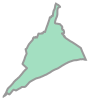

In [24]:
# Plot 1 district (its a collection of points)
maps["geometry"][100]

In [25]:
## Set of points for first district
maps.geometry[0].boundary.coords.xy

(array('d', [-75.31797010604475, -75.31710488392423, -75.31604648791898, -75.31537303628215, -75.31469932241646, -75.31392881111611, -75.3133303495971, -75.31169723519622, -75.30615235974136, -75.30464848475174, -75.30204673484673, -75.30106448524998, -75.29776760924966, -75.29447260989667, -75.28983985902022, -75.28862698442924, -75.2863086102684, -75.2851563586247, -75.28393560955703, -75.28272260912615, -75.28220311024171, -75.28202736045313, -75.28138673398348, -75.28156248370055, -75.28098236019497, -75.28017386006405, -75.27959373487306, -75.27774798404425, -75.27780860999633, -75.27711523520276, -75.27648235912312, -75.27555073511627, -75.27393360884412, -75.27306448398218, -75.27278123480181, -75.27197261018847, -75.27063673497003, -75.26936310921559, -75.26861523478374, -75.26768548488297, -75.26531248414989, -75.26329098403181, -75.26230660998112, -75.26178710908653, -75.26045898389629, -75.2592461099199, -75.25808785916968, -75.25611910895401, -75.25409760880586, -75.2502148

In [26]:
type(maps.geometry)

geopandas.geoseries.GeoSeries

In [27]:
#Check unique values

maps['IDDIST'].is_unique

True

In [28]:
maps['IDDIST'].unique().size

1873

In [29]:
# Select only relevant columns
maps = maps[['IDDIST', 'geometry']]
maps = maps.rename({'IDDIST':'UBIGEO'}, axis =1 )
maps

,UBIGEO,geometry
0,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...
1868,100608,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1869,100609,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1870,100610,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1871,211105,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


In [30]:
maps.dtypes

UBIGEO        object
geometry    geometry
dtype: object

In [31]:
# Object or srting to int

maps['UBIGEO'] = maps['UBIGEO'].astype(str).astype(int)
maps

,UBIGEO,geometry
0,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...
1868,100608,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1869,100609,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1870,100610,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1871,211105,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


In [33]:
#  WGS-84 (longitud-latitud projection) 
maps.crs

#system of coordenates: CRS (due to where we are)

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

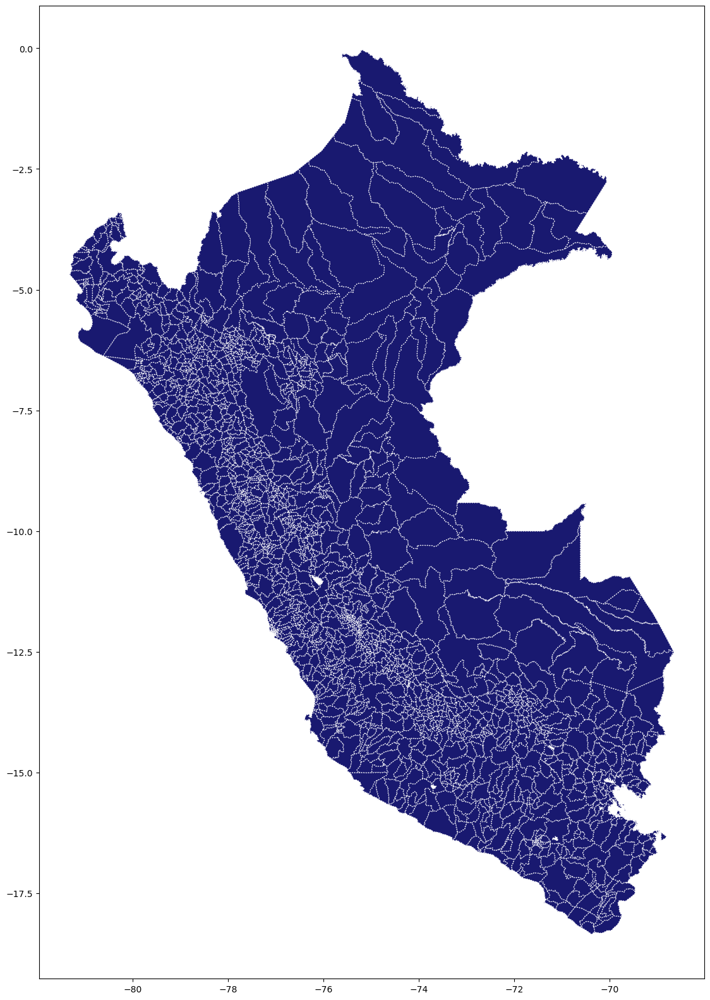

In [36]:
# Plot using geopandas

#figure and axis
fig, ax = plt.subplots(figsize=(20, 20))

maps.plot(  ax=ax, color='midnightblue', linestyle='dotted',
            edgecolor='white' )
plt.show()

## Merge: Covid Data & Shapefile

In [37]:
# Merge using inner way to drop missing values 

dataset_cv = pd.merge(maps, cv_data, how="inner", on="UBIGEO")
dataset_cv

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
0,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,3,2020,0,0,3
1,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,4,2020,0,1,2
2,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,5,2020,1,0,2
3,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,6,2020,7,0,1
4,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297...",HUANUCO,PUERTO INCA,CODO DEL POZUZO,7,2020,11,1,4
...,...,...,...,...,...,...,...,...,...,...
40360,150806,"POLYGON ((-77.37630 -10.89734, -77.37604 -10.8...",LIMA,HUAURA,HUAURA,9,2021,9,0,20
40361,150806,"POLYGON ((-77.37630 -10.89734, -77.37604 -10.8...",LIMA,HUAURA,HUAURA,10,2021,11,2,16
40362,150806,"POLYGON ((-77.37630 -10.89734, -77.37604 -10.8...",LIMA,HUAURA,HUAURA,11,2021,28,1,10
40363,150806,"POLYGON ((-77.37630 -10.89734, -77.37604 -10.8...",LIMA,HUAURA,HUAURA,12,2021,75,1,16


In [38]:
# Function to filter dataset_covid by year, month and administrative space(province)

def subdata( a , b, c ):
    
    if c == "All-Peru":
        
        resultado = dataset_cv.loc[(dataset_cv['Año']== a) & (dataset_cv['Mes']== b)]
    else:
        resultado = dataset_cv.loc[(dataset_cv['Año']== a) & (dataset_cv['Mes']== b) & (dataset_cv['Provincia']== c)]
    return resultado  


In [65]:
base.Provincia.unique()

array(['PUERTO INCA', 'PADRE ABAD', 'CORONEL PORTILLO', 'UCAYALI',
       'TRUJILLO', 'ASCOPE', 'OTUZCO', 'GRAN CHIMU', 'CONTUMAZA',
       'PACASMAYO', 'TACNA', 'JORGE BASADRE', 'ILO', 'TARATA',
       'CANDARAVE', 'MARISCAL NIETO', 'ISLAY', 'CHUCUITO',
       'GENERAL SANCHEZ CERRO', 'CAMANA', 'AREQUIPA', 'EL COLLAO',
       'YUNGUYO', 'CASTILLA', 'CAYLLOMA', 'PUNO', 'CONDESUYOS',
       'CARAVELI', 'SAN ROMAN', 'LAMPA', 'MOHO', 'HUANCANE', 'CHINCHEROS',
       'HUAMALIES', 'SANTA', 'ANTONIO RAYMONDI', 'YUNGAY', 'HUAYLAS',
       'CARLOS FERMIN FITZCARRALD', 'CORONGO', 'POMABAMBA', 'MELGAR',
       'ESPINAR', 'AZANGARO', 'NASCA', 'SAN ANTONIO DE PUTINA',
       'LA UNI<d2>N', 'YAROWILCA', 'HUARAZ', 'RECUAY', 'DOS DE MAYO',
       'LAURICOCHA', 'BOLOGNESI', 'AMBO', 'CAJAMARCA', 'BOLIVAR',
       'CHEPEN', 'MARISCAL CACERES', 'SAN MARCOS', 'HUALLAGA', 'CHICLAYO',
       'CELENDIN', 'OCROS', 'HUARI', 'MARA<d1>ON', 'HUAYTARA', 'CARABAYA',
       'QUISPICANCHI', 'PISCO', 'ANDAHUAYLAS', 'A

In [66]:
#Second wave 
base = subdata( 2020 , 8, "All-Peru")  # all peru Aug-2020

#Second wave only Lima
base_lima = subdata( 2020 , 8, "LIMA")  # Lima Aug-2020

#Second wave only Lima
base_ayacucho = subdata( 2020 , 10, "LUCANAS")  # Lima Aug-2020

In [67]:
base_ayacucho

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales
24617,50618,"POLYGON ((-74.45485 -14.15098, -74.45421 -14.1...",AYACUCHO,LUCANAS,SAN PEDRO DE PALCO,10,2020,0,0,0
37773,50617,"POLYGON ((-74.12341 -14.73414, -74.12249 -14.7...",AYACUCHO,LUCANAS,SAN PEDRO,10,2020,1,0,0
37819,50621,"POLYGON ((-74.39258 -14.72377, -74.39211 -14.7...",AYACUCHO,LUCANAS,SANTA LUCIA,10,2020,0,0,0
37842,50615,"POLYGON ((-74.28449 -14.69725, -74.28211 -14.6...",AYACUCHO,LUCANAS,SAN CRISTOBAL,10,2020,2,0,0
37957,50619,"POLYGON ((-74.04573 -14.91000, -74.04615 -14.9...",AYACUCHO,LUCANAS,SANCOS,10,2020,6,0,0
38003,50614,"POLYGON ((-74.36156 -14.77078, -74.35963 -14.7...",AYACUCHO,LUCANAS,SAISA,10,2020,0,0,0
38026,50605,"POLYGON ((-73.87660 -14.80292, -73.87742 -14.8...",AYACUCHO,LUCANAS,CHAVI<d1>A,10,2020,0,0,2
38049,50616,"POLYGON ((-74.17274 -14.59704, -74.17246 -14.5...",AYACUCHO,LUCANAS,SAN JUAN,10,2020,0,0,0
38417,50609,"POLYGON ((-74.43725 -14.52504, -74.43454 -14.5...",AYACUCHO,LUCANAS,LEONCIO PRADO,10,2020,1,0,0
38440,50606,"POLYGON ((-73.85391 -14.27810, -73.85018 -14.2...",AYACUCHO,LUCANAS,CHIPAO,10,2020,2,0,1


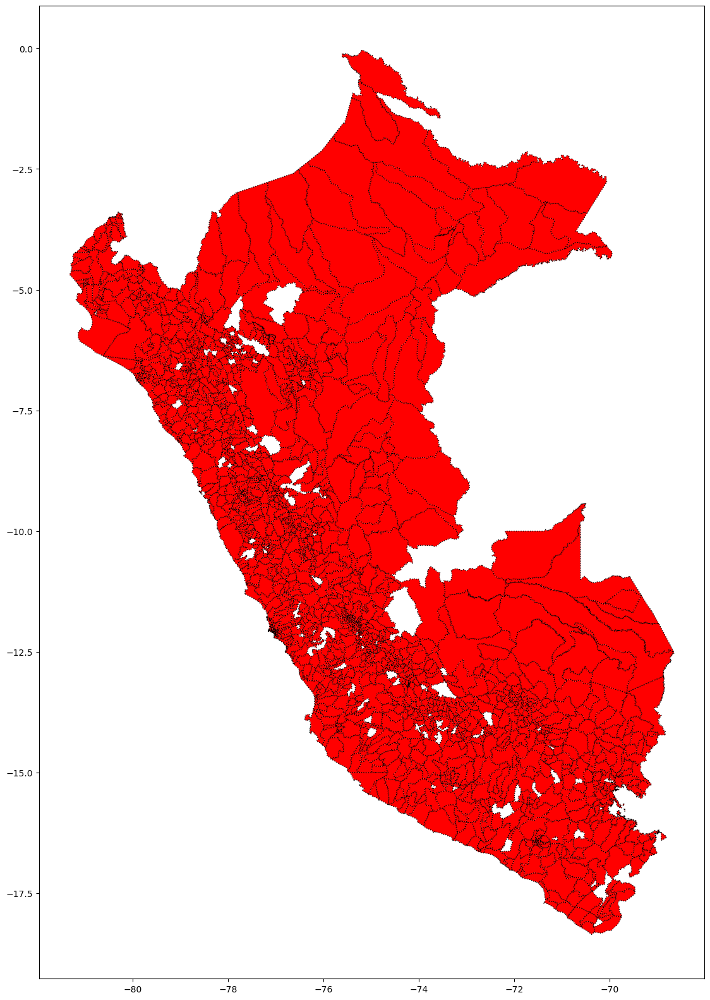

In [68]:
fig, ax = plt.subplots(figsize=(20, 20))

base.plot(  ax=ax, color='red', linestyle='dotted',
            edgecolor='black' )
plt.show()

#does not picture the provinces who dont have covid cases.

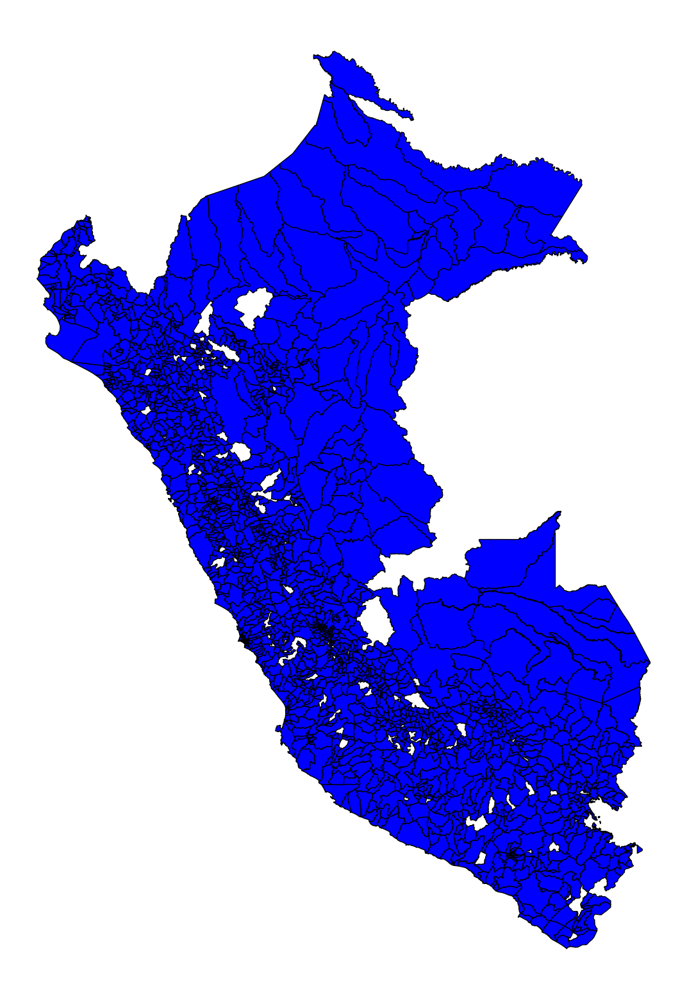

In [69]:
# Plot without axis

fig, ax = plt.subplots(figsize=(20, 20))
base.plot(ax=ax,color='blue', linestyle='-',
                      edgecolor='black')
ax.set_axis_off()

## Plot covid infection at disctrict level 

<AxesSubplot:>

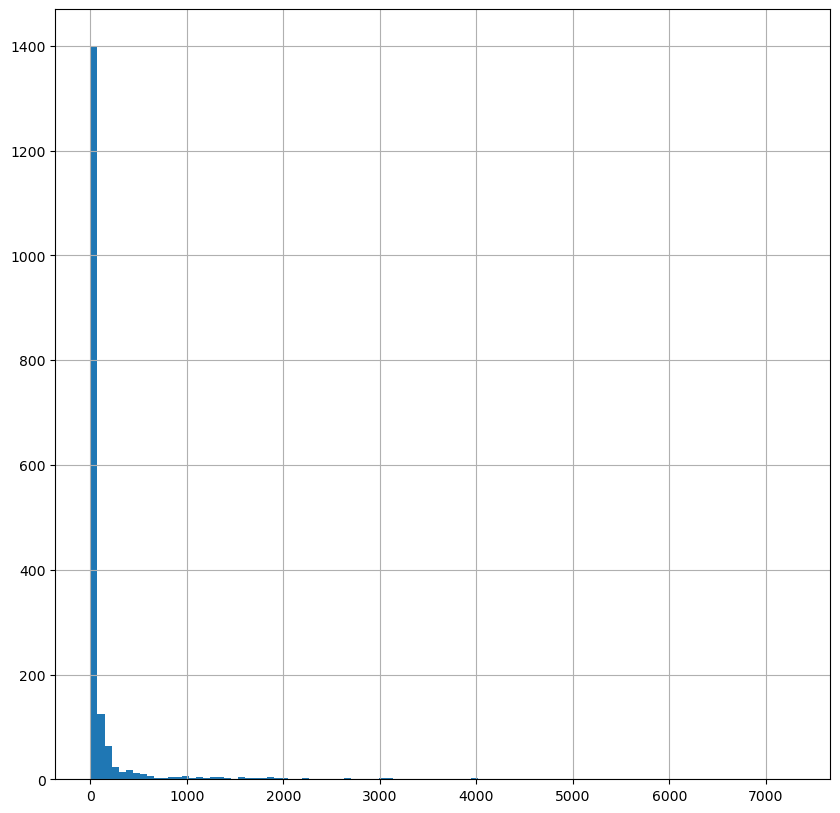

In [70]:
# First always check the distribution
fig, ax = plt.subplots(figsize=(10, 10))
base["Casos"].hist(bins = 100)

#check the distribution of the variables BEFORE PLOTTING

<AxesSubplot:>

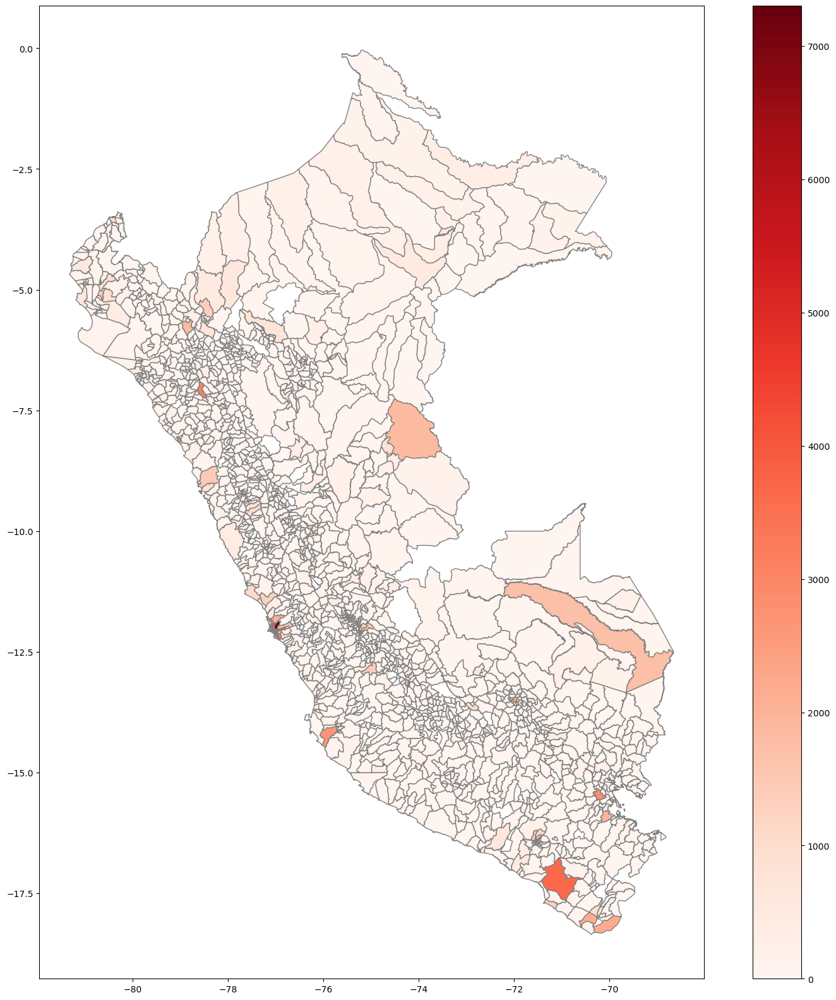

In [71]:
# Plot covid infection at disctrict level 

base.plot( column='Casos', cmap='Reds', 
          figsize=(20, 20),
          linestyle='-',
          edgecolor='gray',
          legend = True )

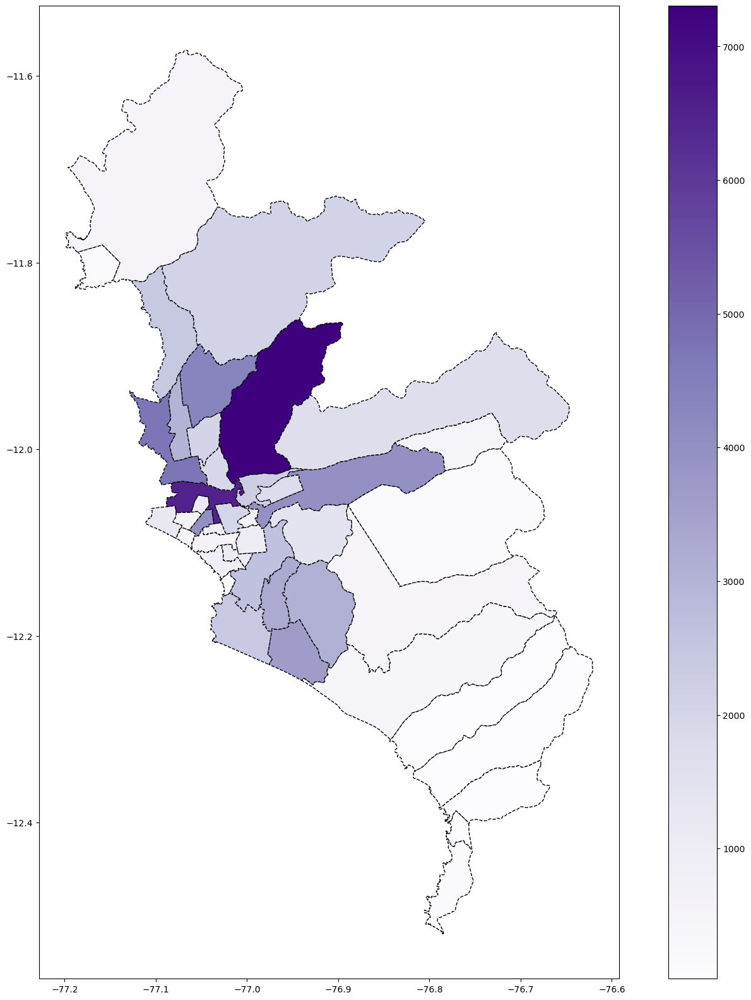

In [48]:
# Covid & Lima Matropolitana 

base_lima.plot(column='Casos', cmap='Purples', figsize=(20, 20), linestyle='--',
                      edgecolor='black', 
                      legend = True)

# save map
plt.savefig(r'Lima_covid_Heatmap.png')

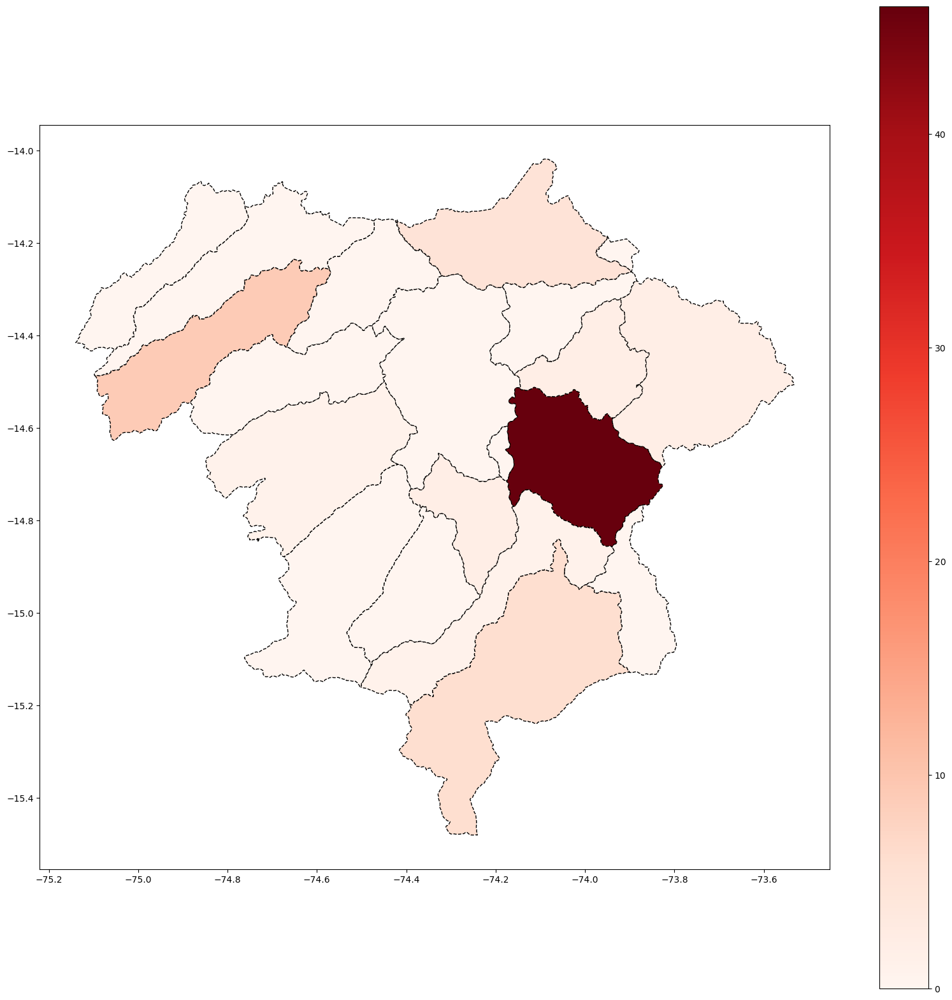

In [73]:
# Covid & Lima Matropolitana 

base_ayacucho.plot(column='Casos', cmap='Reds', figsize=(20, 20), linestyle='--',
                      edgecolor='black', 
                      legend = True)

# save map
plt.savefig(r'Ayacucho_covid_Heatmap.png')

In [74]:
base_lima.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Get Centroid

In [86]:
# Centroid (point in the center)

#base_lima = base_lima.to_crs("EPSG:32733")
#WGS84 (MAP IN CURVE) > PROJ IN METER "EPSG:24891" TO CALCULATE CENTROID > CONVERT TO CURVE AGAIN (THE CENTROID CAN BE OUT BECAUSE IF THE IMAGE IS CONCAVA)


base_lima['centroid'] = base_lima['geometry'].to_crs("EPSG:24891").centroid.to_crs("EPSG:4326")

C:\Users\DELL\anaconda3\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [87]:
base_lima

,UBIGEO,geometry,Departamento,Provincia,Distrito,Mes,Año,Casos,Muertes Covid,Muertes totales,centroid
8147,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,LURIN,8,2020,452,29,68,POINT (-76.80109 -12.23426)
9090,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,ANCON,8,2020,460,30,51,POINT (-77.09580 -11.70252)
11689,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,SAN ISIDRO,8,2020,551,30,86,POINT (-77.03667 -12.09898)
11712,150120,"POLYGON ((-77.07210 -12.08358, -77.06348 -12.0...",LIMA,LIMA,MAGDALENA DEL MAR,8,2020,478,49,94,POINT (-77.06669 -12.09384)
11735,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,SAN BORJA,8,2020,1012,54,123,POINT (-76.99521 -12.09755)
11758,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,LINCE,8,2020,855,76,129,POINT (-77.03567 -12.08579)
11781,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,SANTIAGO DE SURCO,8,2020,2628,171,394,POINT (-76.98431 -12.12699)
11850,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,PUEBLO LIBRE,8,2020,633,61,140,POINT (-77.06574 -12.07508)
12379,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,SANTA ROSA,8,2020,114,9,15,POINT (-77.16325 -11.80501)
15047,150106,"POLYGON ((-76.89995 -11.72979, -76.89921 -11.7...",LIMA,LIMA,CARABAYLLO,8,2020,2054,183,281,POINT (-76.97291 -11.80738)


In [88]:
# fig, ax = plt.subplots(figsize=(20, 20))

# # Heatmap Lima and Covid infection

# base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
#                       edgecolor='black', 
#                       legend = True, ax=ax)

In [89]:
props = dict(boxstyle='round', facecolor = 'linen', alpha =1)
props

{'boxstyle': 'round', 'facecolor': 'linen', 'alpha': 1}

In [90]:
# for point in base_lima.iterrows():
#     print(point[1]['Distrito'])

## Add District Names in Centroid

<AxesSubplot:>

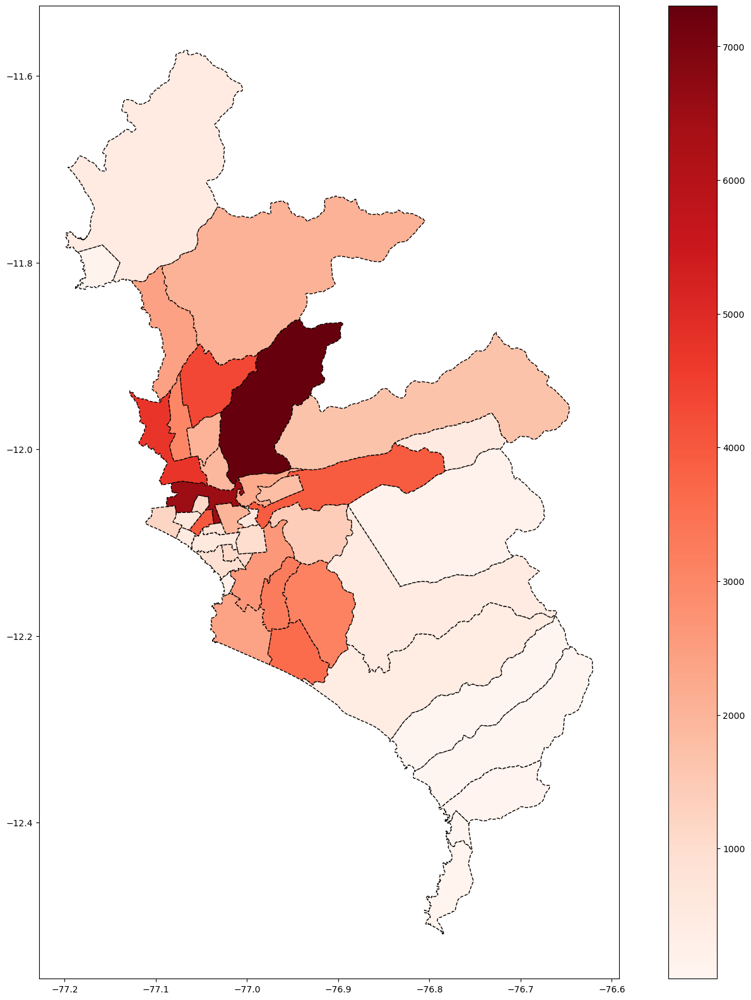

In [91]:
fig, ax = plt.subplots(figsize=(20, 20))

# Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

In [92]:
#base_lima['centroid']

In [93]:
# for point in base_lima.iterrows():
#     print(point[1]['Distrito'])

In [94]:
props = dict(boxstyle='round', facecolor = 'linen', alpha =1)

In [95]:
props

{'boxstyle': 'round', 'facecolor': 'linen', 'alpha': 1}

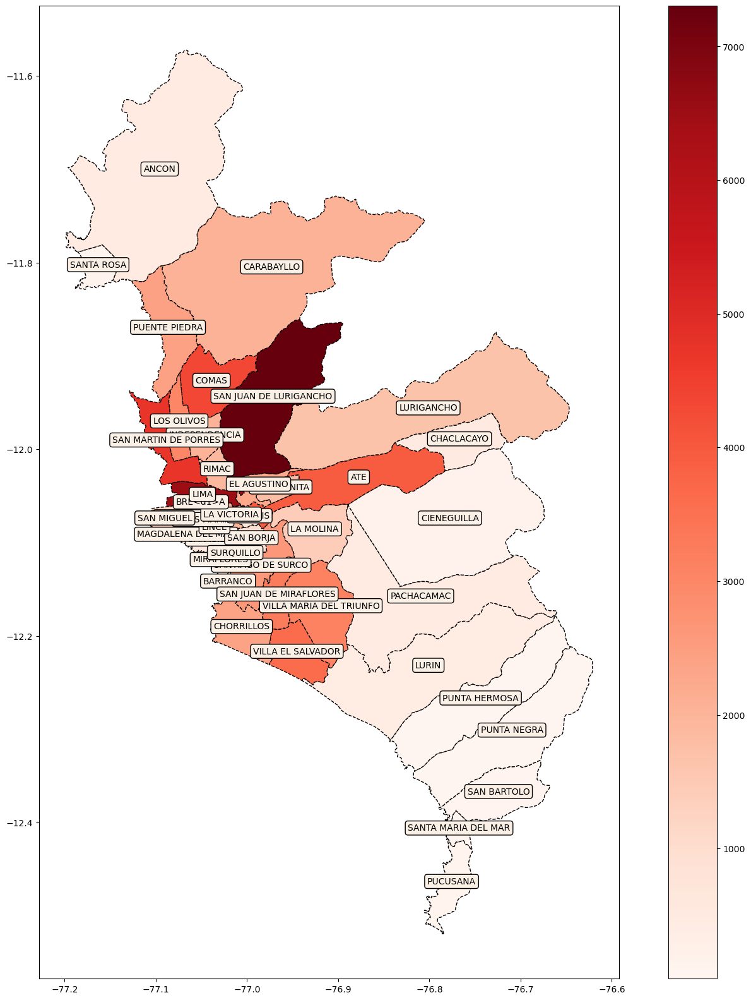

In [96]:
fig, ax = plt.subplots(figsize=(20, 20))

# Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

# add district name in litle box

props = dict(boxstyle='round', facecolor = 'linen', alpha =1)

for point in base_lima.iterrows():
        ax.text( point[1]['centroid'].x,
                 point[1]['centroid'].y,
                 point[1]['Distrito'],
                 horizontalalignment='center',
                 fontsize=10,
                 bbox=props )

plt.savefig(r'Lima_covid_Heatmap_2.png')
#plot.savefig(r'Lima_covid_Heatmap_2.png')

<AxesSubplot:>

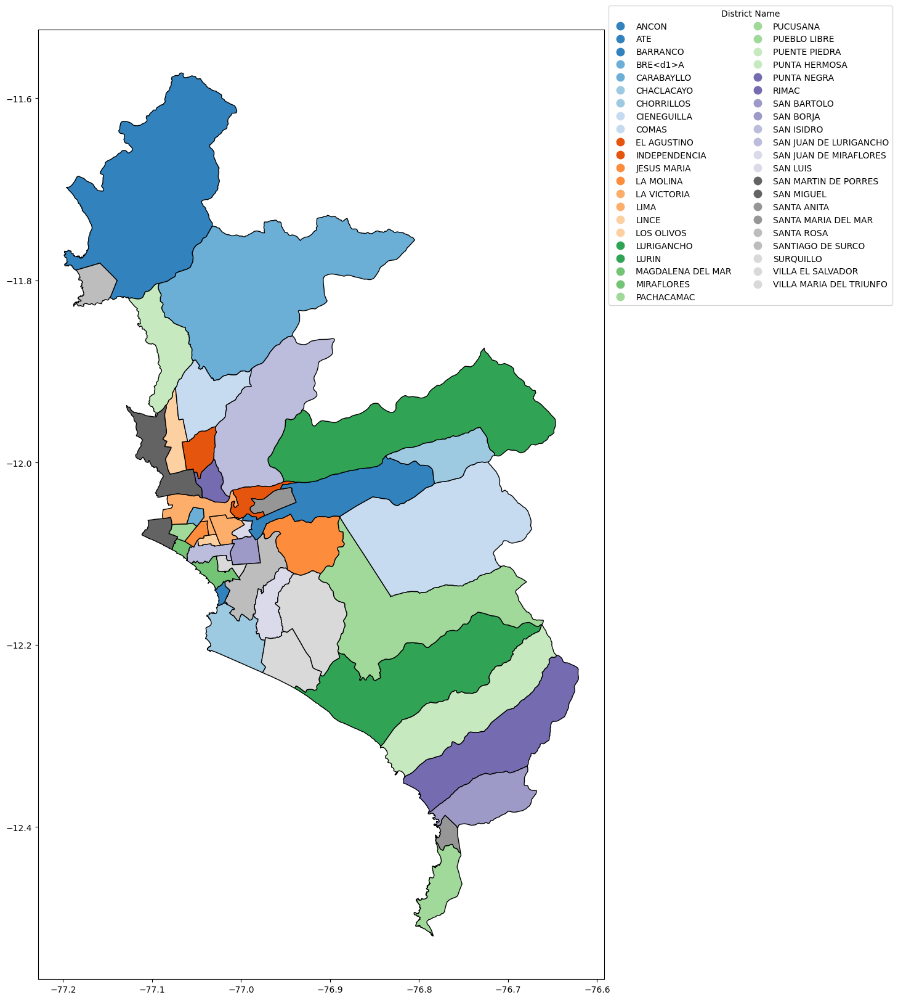

In [98]:
# Using legend by district 

leg_kwds={'title':'District Name',
          'loc': 'upper left',
          'bbox_to_anchor':(1, 1.03),
          'ncol':2}


base_lima.plot(column='Distrito', cmap='tab20c', figsize=(20, 20), legend = True, linestyle='-', 
               edgecolor='black',
               legend_kwds = leg_kwds)

## Public Health Centers Data

In [104]:
base_lima.geometry.iloc[1:2]

#NOTH (x), EAST(Y)

9090    POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...
Name: geometry, dtype: geometry

In [105]:
# import csv file of public health centers: MINSA, ESSALUD and Regional Goverment
# coordinates information (NORTE: longitud) (ESTE: latitud)

health_centers = pd.read_csv(r'../_data/centros_hospitalarios.csv')
health_centers.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Estado,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,ACTIVADO,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3


In [106]:
health_centers.columns

Index(['Institución', 'Código Único', 'Nombre del establecimiento',
       'Clasificación', 'Tipo', 'Departamento', 'Provincia', 'Distrito',
       'UBIGEO', 'Dirección', 'Código DISA', 'Código Red', 'Código Microrred',
       'DISA', 'Red', 'Microrred', 'Código UE', 'Unidad Ejecutora',
       'Categoria', 'Teléfono', 'Tipo Doc.Categorización',
       'Nro.Doc.Categorización', 'Horario', 'Inicio de Actividad',
       'Director Médico y/o Responsable de la Atención de Salud', 'Estado',
       'Situación', 'Condición', 'Inspección', 'NORTE', 'ESTE', 'COTA',
       'CAMAS', 'code1', 'code2'],
      dtype='object')

In [107]:
health_centers.NORTE

0      -81.310632
1      -81.306508
2      -81.303974
3      -81.275139
4      -81.273840
          ...    
8459          NaN
8460          NaN
8461          NaN
8462          NaN
8463          NaN
Name: NORTE, Length: 8464, dtype: float64

In [108]:
# DataFrame to GeoDataFrame

Public_health = gpd.GeoDataFrame( health_centers, geometry=gpd.points_from_xy( health_centers.NORTE, health_centers.ESTE ) )
Public_health.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1,POINT (-81.31063 -4.66504)
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1,POINT (-81.30651 -4.65438)
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1,POINT (-81.30397 -4.65863)
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1,POINT (-81.27514 -4.45663)
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.27384 -4.56842)


In [110]:
# Setting UTM Zones (South): "EPSG:32733" #depending on the zone, it is PERU

# Public_health = Public_health.set_crs("EPSG:32733")
Public_health = Public_health.set_crs( "EPSG:32718", allow_override = True)
Public_health.crs

<Projected CRS: EPSG:32718>
Name: WGS 84 / UTM zone 18S
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World - S hemisphere - 78°W to 72°W - by country
- bounds: (-78.0, -80.0, -72.0, 0.0)
Coordinate Operation:
- name: UTM zone 18S
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [111]:
Public_health.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1,POINT (-81.311 -4.665)
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1,POINT (-81.307 -4.654)
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1,POINT (-81.304 -4.659)
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1,POINT (-81.275 -4.457)
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.274 -4.568)


## Types and classification public centers

#### We focus on Postas médicas and Hospitales

#### code2 (Type)

ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO:			1

SERVICIO MÉDICO DE APOYO:			                2

ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO:			3


#### code1 (Clasification)

ATENCION PRE HOSPITALARIA:	1

CENTROS DE ATENCION PARA DEPENDIENTES A SUSTANCIAS PSICOACTIVAS Y OTRAS DEPENDENCIAS:	2

CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO:	3

CENTROS DE SALUD O CENTROS MEDICOS:	4

CENTROS DE SALUD O CENTROS MEDICOS,CENTROS DE SALUD O CENTROS MEDICOS:	5

CENTROS DE VACUNACION:	6

CENTROS MEDICOS ESPECIALIZADOS:	7

CONSULTORIOS MEDICOS Y DE OTROS PROFESIONALES DE LA SALUD:	8

ESTABLECIMIENTOS DE RECUPERACION O REPOSO:	9

HEMODIALISIS:	10

HOSPITALES O CLINICAS DE ATENCION ESPECIALIZADA:	11

HOSPITALES O CLINICAS DE ATENCION GENERAL:	12

INSTITUTOS DE SALUD ESPECIALIZADOS:	13

MEDICINA FISICA,REHABILITACION:	14

PATOLOGIA CLINICA:	15

PATOLOGIA CLINICA,ANATOMIA PATOLOGICA:	16

PATOLOGIA CLINICA,DIAGNOSTICO POR IMAGENES:	17

POLICLINICOS:	18

PUESTOS DE SALUD O POSTAS DE SALUD:	19

PUESTOS DE SALUD O POSTAS DE SALUD,PUESTOS DE SALUD O POSTAS DE SALUD:	19

SERVICIO DE TRASLADO DE PACIENTES:	20

SERVICIO DE TRASLADO DE PACIENTES,ATENCION DOMICILIARIA:	21

SERVICIO DE TRASLADO DE PACIENTES,ATENCION DOMICILIARIA,ATENCION PRE HOSPITALARIA:	22

SERVICIO DE TRASLADO DE PACIENTES,ATENCION PRE HOSPITALARIA:	23

CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO:	24


In [112]:
Public_health.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
0,GOBIERNO REGIONAL,2076,SAN PABLO,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,LAMBAYEQUE S/N NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.310632,-4.665043,15.3,NaN,19,1,POINT (-81.311 -4.665)
1,ESSALUD,20628,POSTA MEDICA NEGRITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,AVENIDA SAN MARTIN Nº 100 NEGRITOS,...,,EN FUNCIONAMIENTO,,-81.306508,-4.654384,20.4,NaN,19,1,POINT (-81.307 -4.654)
2,GOBIERNO REGIONAL,2075,NEGRITOS,CENTROS DE SALUD O CENTROS MEDICOS,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LA BREA,200703,URB. SUD AMERICA D-14 TALARA,...,,EN FUNCIONAMIENTO,,-81.303974,-4.658634,41.6,NaN,4,1,POINT (-81.304 -4.659)
3,GOBIERNO REGIONAL,2077,LOBITOS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,PIURA,TALARA,LOBITOS,200704,BARRIO PRIMAVERA A- 100 LOBITOS,...,,EN FUNCIONAMIENTO,,-81.275139,-4.456625,39.4,NaN,19,1,POINT (-81.275 -4.457)
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.274 -4.568)


In [113]:
# code1 = 19 to postas médicas 
# code1 = 12 & 24 to Hospitals

Public_health1 = Public_health[Public_health.code1 == "19"]

Public_health2 = Public_health[(Public_health.code1 == "12") | (Public_health.code1 == "24")]
Public_health2.head( 5 )

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
4,ESSALUD,12243,HOSPITAL II ESSALUD TALARA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AV. PANAMERICANA S/N CARRETERA A LOBITOS,...,,EN FUNCIONAMIENTO,,-81.273840,-4.568419,28.7,35.0,12,3,POINT (-81.274 -4.568)
5,GOBIERNO REGIONAL,2074,TALARA II,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,TALARA,PARIÑAS,200701,AVENIDA GRAU S/N EXPOLICLINICO PETROPERU,...,,EN FUNCIONAMIENTO,,-81.272096,-4.578829,21.1,NaN,24,3,POINT (-81.272 -4.579)
19,ESSALUD,11763,HOSPITAL I MIGUEL CRUZADO VERA - PAITA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,PAITA,PAITA,200501,CARRETERA PAITA - PIURA KM 1.5,...,,EN FUNCIONAMIENTO,,-81.100243,-5.087583,75.9,12.0,24,3,POINT (-81.100 -5.088)
20,GOBIERNO REGIONAL,2021,HOSPITAL LAS MERCEDES-PAITA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,PAITA,PAITA,200501,LOS PESCADORES S/N LA PUNTA,...,,EN FUNCIONAMIENTO,,-81.091531,-5.090815,78.3,79.0,12,3,POINT (-81.092 -5.091)
23,GOBIERNO REGIONAL,2026,PUEBLO NUEVO DE COLAN,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,PIURA,PAITA,COLAN,200504,JR. ALFONSO UGARTE S/N,...,,EN FUNCIONAMIENTO,,-81.058005,-4.911551,16.6,NaN,24,3,POINT (-81.058 -4.912)


In [114]:
# # Quantiles quantity of infection 

# base_lima.plot(column='Casos', cmap='Set2', figsize=(20, 20), linestyle=':', 
#                edgecolor='black',
#                legend = True)

In [115]:
# Postas Médicas and Hospitales públicos - LIMA

PH_lima_postas = Public_health1[Public_health1.Provincia == "LIMA"]

PH_lima_hospitales = Public_health2[Public_health2.Provincia == "LIMA"]
PH_lima_hospitales

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
2715,MINSA,5814,CENTRO DE SALUD MATERNO INFANTIL ANCON,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,ANCON,150102,JR. LOA 595 ANCON,...,,EN FUNCIONAMIENTO,,-77.172725,-11.774719,12.0,NaN,24,3,POINT (-77.173 -11.775)
2803,MINSA,5816,MATERNO INFANTIL DR. ENRIQUE MARTIN ALTUNA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,ASOC VIV E INDUSTRIAS VIRGEN DE LAS NIEVES URB...,...,,EN FUNCIONAMIENTO,,-77.109100,-11.837611,200.0,NaN,24,3,POINT (-77.109 -11.838)
2832,ESSALUD,8564,HOSPITAL I OCTAVIO MONGRUT MUÑOZ,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,SAN MIGUEL,150136,AV PARQUE DE LAS LEYENDAS 255,...,,EN FUNCIONAMIENTO,,-77.094583,-12.065961,NaN,49.0,12,3,POINT (-77.095 -12.066)
2852,MINSA,5817,SANTA ROSA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,"AA.HH. SANTA ROSA, MZ. 50, LOTE PM - AV. SANTA...",...,,EN FUNCIONAMIENTO,,-77.081693,-11.874827,200.0,NaN,24,3,POINT (-77.082 -11.875)
2859,MINSA,7632,HOSPITAL CARLOS LANFRANCO LA HOZ,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,AV. SAENZ PEÑA - CUADRA 6 S/N,...,,EN FUNCIONAMIENTO,,-77.079335,-11.863181,NaN,102.0,12,3,POINT (-77.079 -11.863)
2862,MINSA,5799,CLAS JUAN PABLO II,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,LOS OLIVOS,150117,CALLE 28 S/N AA.HH. JUAN PABLO II,...,,EN FUNCIONAMIENTO,,-77.078891,-11.953212,63.0,NaN,24,3,POINT (-77.079 -11.953)
2875,MINSA,5821,LOS SUREÑOS,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,PUENTE PIEDRA,150125,COOP. VIVIENDA LOS SUREÑOS MZ M LT. 35,...,,EN FUNCIONAMIENTO,,-77.069701,-11.887532,200.0,NaN,24,3,POINT (-77.070 -11.888)
2879,MINSA,6196,MAGDALENA,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,MAGDALENA DEL MAR,150120,JR. JUNÍN 322,...,,EN FUNCIONAMIENTO,,-77.068627,-12.088694,27.0,NaN,24,3,POINT (-77.069 -12.089)
2887,MINSA,6214,HOSPITAL VICTOR LARCO HERRERA,HOSPITALES O CLINICAS DE ATENCION GENERAL,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,MAGDALENA DEL MAR,150120,AV.AUGUSTO PEREZ ARANIBAR N° 600,...,,EN FUNCIONAMIENTO,,-77.065756,-12.098705,NaN,590.0,12,3,POINT (-77.066 -12.099)
2904,MINSA,5772,CENTRO MATERNO INFANTIL SANTA LUZMILA II,CENTROS DE SALUD CON CAMAS DE INTERNAMIENTO,ESTABLECIMIENTO DE SALUD CON INTERNAMIENTO,LIMA,LIMA,COMAS,150110,AVENIDA AV. 22 DE AGOSTO N° 1001- URB SANTA LU...,...,,EN FUNCIONAMIENTO,,-77.058712,-11.947025,101.0,NaN,24,3,POINT (-77.059 -11.947)


## Covid y Postas

<AxesSubplot:>

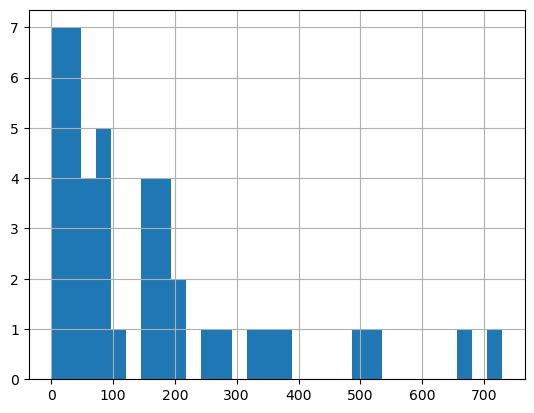

In [119]:
base_lima["Muertes Covid"].hist(bins=30)

In [120]:
PH_lima_postas

,Institución,Código Único,Nombre del establecimiento,Clasificación,Tipo,Departamento,Provincia,Distrito,UBIGEO,Dirección,...,Situación,Condición,Inspección,NORTE,ESTE,COTA,CAMAS,code1,code2,geometry
2725,MINSA,5824,SAN JOSE,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,ANCON,150102,ESQ. CALLE Nº 17 Y CALLE Nº 9 URB. DE INTERES ...,...,,EN FUNCIONAMIENTO,,-77.162575,-11.778237,12.0,NaN,19,1,POINT (-77.163 -11.778)
2728,MINSA,14727,PROFAM,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,SANTA ROSA,150139,"AV. SANTA ROSA, MANZANA O-2 / ASOCIACION DE VI...",...,,EN FUNCIONAMIENTO,,-77.159128,-11.817327,NaN,NaN,19,1,POINT (-77.159 -11.817)
2740,MINSA,16525,VILLAS DE ANCON,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,ANCON,150102,MZ X ASOCIACION PRO-VIVIENDA VILLAS DE ANCON,...,,EN FUNCIONAMIENTO,,-77.145966,-11.733970,0.0,NaN,19,1,POINT (-77.146 -11.734)
2762,MINSA,5825,VIRGEN DE LAS MERCEDES,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,SANTA ROSA,150139,ASOC. VIV. SANTA ROSA MZ. B LT. 09,...,,EN FUNCIONAMIENTO,,-77.131677,-11.815250,12.0,NaN,19,1,POINT (-77.132 -11.815)
2797,MINSA,5750,CERRO LA REGLA,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,SAN MARTIN DE PORRES,150135,"MZ B LT 11 - AAHH ESPERANZA, COMITÉ 2",...,,EN FUNCIONAMIENTO,,-77.115765,-11.989613,123.0,NaN,19,1,POINT (-77.116 -11.990)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3486,MINSA,5868,SEÑOR DE LOS MILAGROS,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,LURIGANCHO,150118,AVENIDA AV.PRECURSORES S/N AAHH NICOLAS DE PIE...,...,,EN FUNCIONAMIENTO,,-76.714793,-11.935857,911.0,NaN,19,1,POINT (-76.715 -11.936)
3516,MINSA,5870,PABLO PATRON,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,LURIGANCHO,150118,AAHH PABLO PATRON - CALLE 14 MZ. V LOTE 7 DIST...,...,,EN FUNCIONAMIENTO,,-76.686205,-11.930408,911.0,NaN,19,1,POINT (-76.686 -11.930)
3519,MINSA,5867,MARISCAL CASTILLA,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,LURIGANCHO,150118,CALLE SANTA ROSA MZ O S/N - AAHH MARISCAL CAST...,...,,EN FUNCIONAMIENTO,,-76.685491,-11.933911,911.0,NaN,19,1,POINT (-76.685 -11.934)
8125,MINSA,5940,HUASCATA,PUESTOS DE SALUD O POSTAS DE SALUD,ESTABLECIMIENTO DE SALUD SIN INTERNAMIENTO,LIMA,LIMA,CHACLACAYO,150107,OTROS MZ N LOTE 05 AAHH CERRO VECINO HUASCATA-...,...,,EN FUNCIONAMIENTO,,NaN,NaN,NaN,NaN,19,1,POINT (nan nan)


<AxesSubplot:>

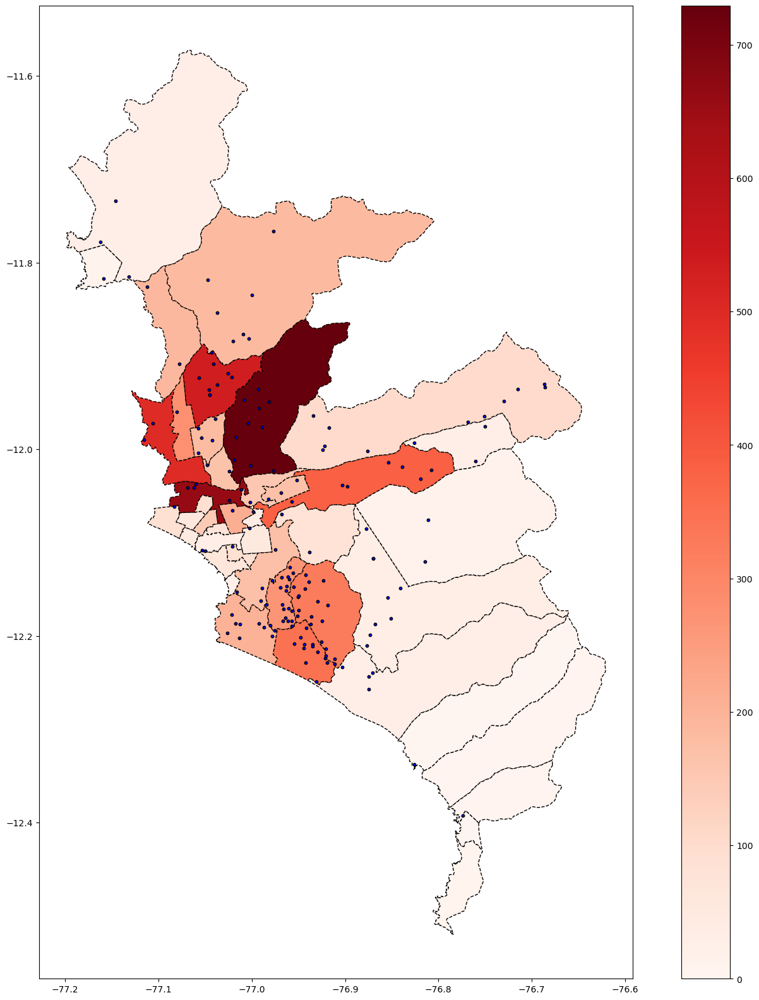

In [122]:
# Covid deaths and Postas médicas 

fig, ax = plt.subplots(figsize=(20, 20))

#Heatmap Lima and Covid infection

base_lima.plot( column='Muertes Covid', 
               cmap='Reds', 
               linestyle='--',
               edgecolor='black', 
               legend = True, 
               ax=ax )

# Plot in the shapefile (R style)
PH_lima_postas.plot(ax = ax, color = 'blue', markersize=10, edgecolor='black')

## Hospitales Públicos y Postas Médicas

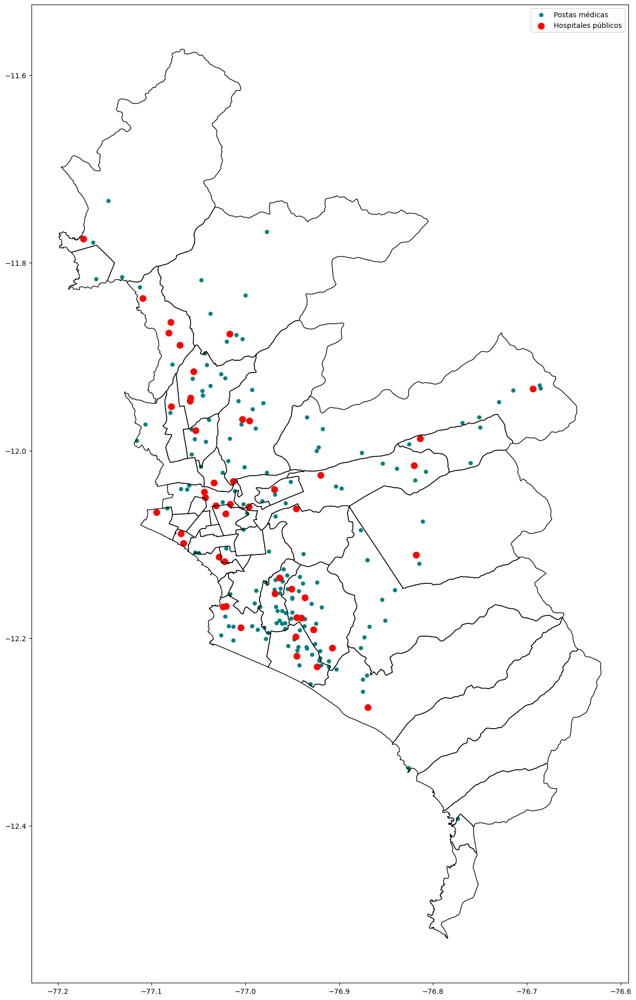

In [123]:
ax = base_lima.plot(figsize=(25, 25), color='none', edgecolor='black', zorder=3)

PH_lima_postas.plot(color='teal', label = "Postas médicas", markersize=25, ax=ax)
PH_lima_hospitales.plot(color='red', label = "Hospitales públicos", markersize=75, ax=ax)

plt.legend(loc='upper right')

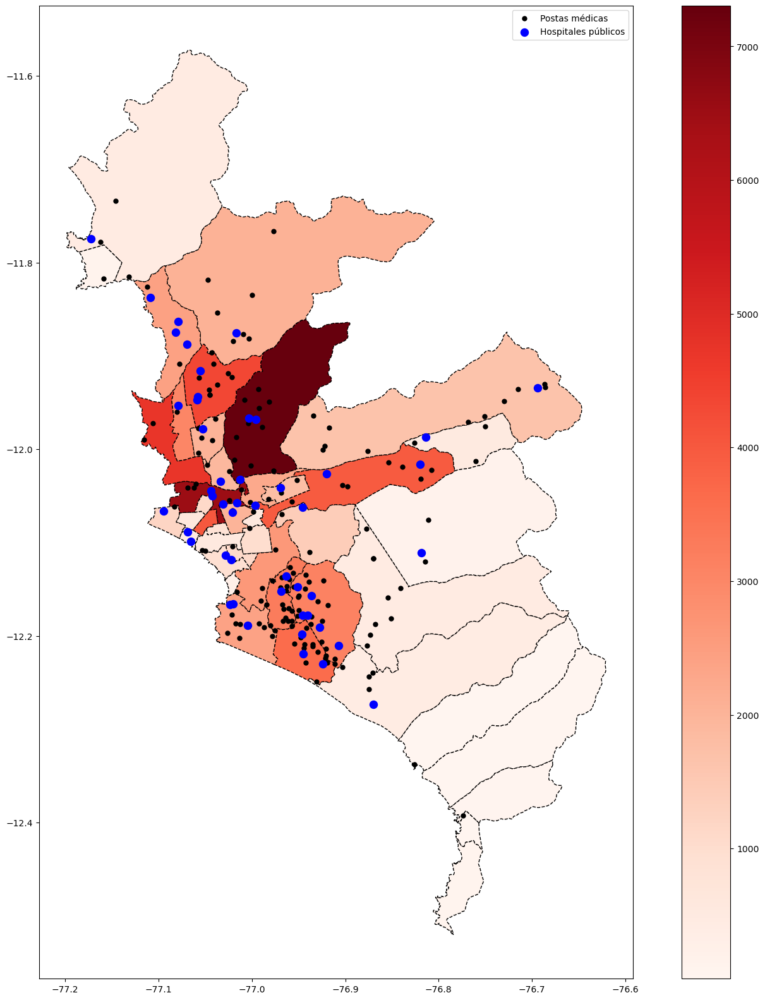

In [124]:
# Covid infection and Postas médicas 

fig, ax = plt.subplots(figsize=(20, 20))

#Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

PH_lima_postas.plot(color='black', label = "Postas médicas", markersize=25, ax=ax)
PH_lima_hospitales.plot(color='blue', label = "Hospitales públicos", markersize=75, ax=ax)

plt.legend(loc='upper right')

In [125]:
PH_lima_hospitales['CAMAS'].describe

<bound method NDFrame.describe of 2715      NaN
2803      NaN
2832     49.0
2852      NaN
2859    102.0
2862      NaN
2875      NaN
2879      NaN
2887    590.0
2904      NaN
2905    106.0
2912      NaN
2927      NaN
2943     49.0
2955    662.0
2984      NaN
2988    231.0
2997     84.0
3009      NaN
3017      NaN
3023      NaN
3027      NaN
3036      NaN
3040    594.0
3048      NaN
3071      NaN
3077    150.0
3093      6.0
3096     54.0
3161      6.0
3164      NaN
3175      NaN
3204      NaN
3213      NaN
3214     50.0
3216      NaN
3217      NaN
3230    199.0
3238      NaN
3255      NaN
3262      NaN
3269    111.0
3284      NaN
3322      NaN
3363     51.0
3370      NaN
3382     10.0
3508     67.0
7909     57.0
Name: CAMAS, dtype: float64>

In [126]:
# drop raws with nan values 

PH_lima_hospitales = PH_lima_hospitales.dropna(subset=['CAMAS'])

In [127]:
#markersize

## Relative Size of Markers from panda series

In [129]:
PH_lima_hospitales["CAMAS"]

2832     49.0
2859    102.0
2887    590.0
2905    106.0
2943     49.0
2955    662.0
2988    231.0
2997     84.0
3040    594.0
3077    150.0
3093      6.0
3096     54.0
3161      6.0
3214     50.0
3230    199.0
3269    111.0
3363     51.0
3382     10.0
3508     67.0
7909     57.0
Name: CAMAS, dtype: float64

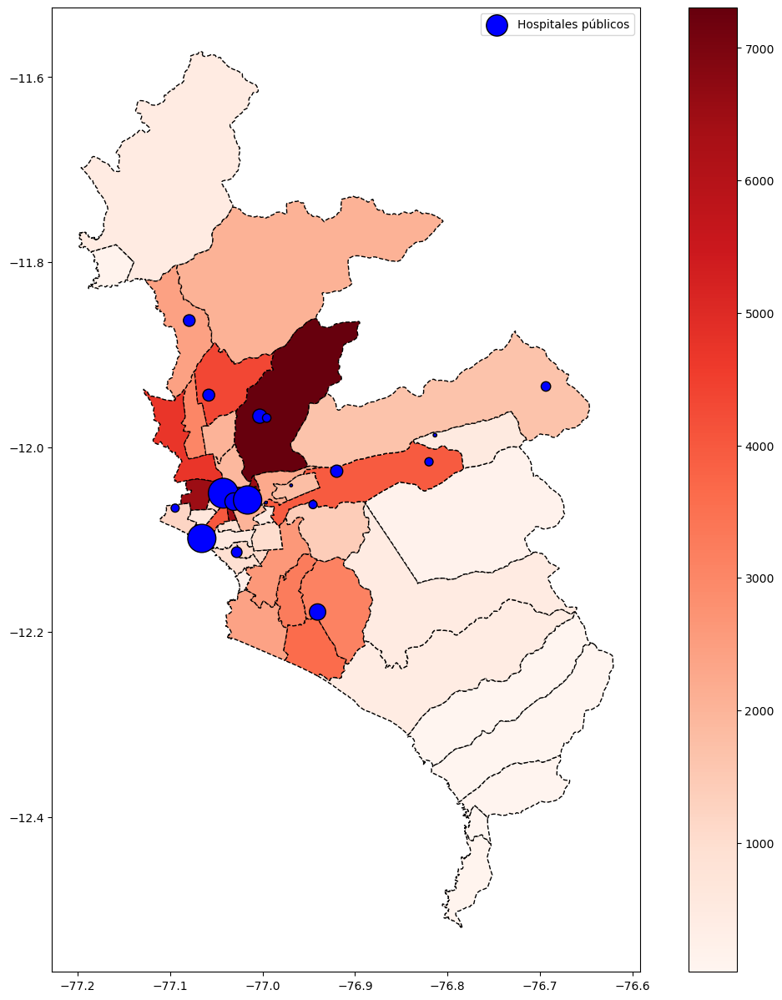

In [130]:
# Covid infection and Public Hospital by number of beds 

fig, ax = plt.subplots(figsize=(15, 15))

#define the size
markersize=PH_lima_hospitales['CAMAS']

#Heatmap Lima and Covid infection

base_lima.plot(column='Casos', cmap='Reds', linestyle='--',
                      edgecolor='black', 
                      legend = True, ax=ax)

PH_lima_hospitales.plot( ax=ax, color='blue', label = "Hospitales públicos", markersize = markersize,
                       edgecolor='black')
plt.legend(loc='upper right')

<AxesSubplot:>

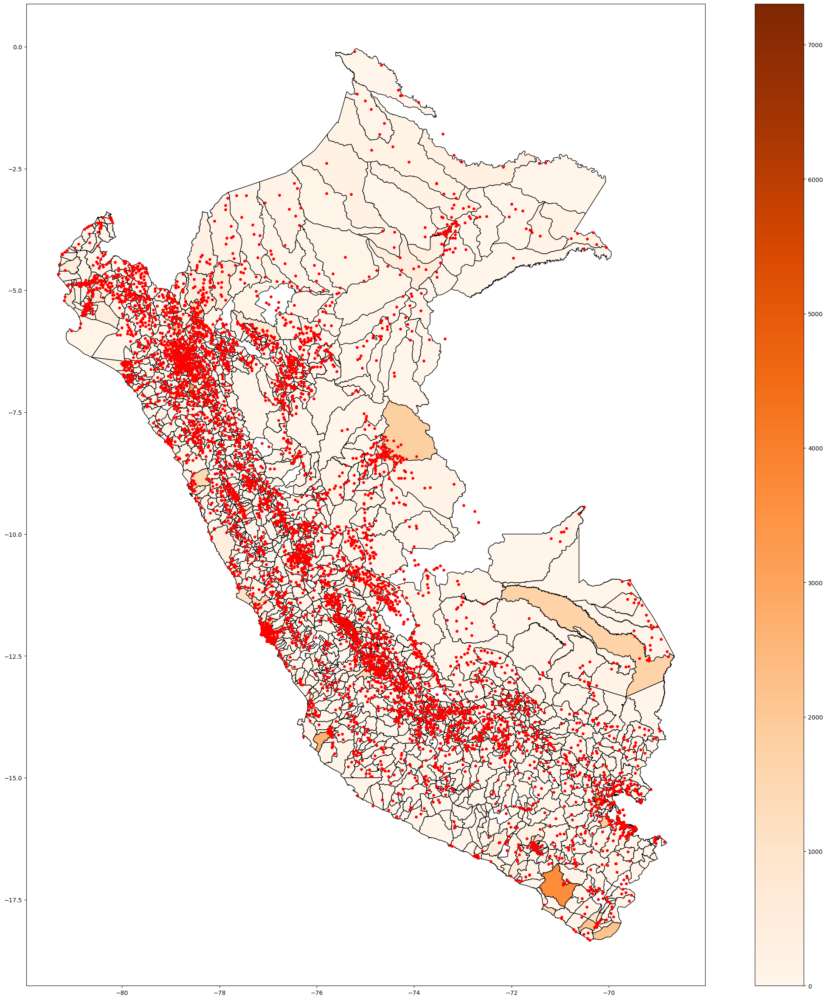

In [131]:
# Covid infection & postas médicas at the national level 

gf = base.plot(column='Casos', cmap='Oranges', 
          figsize=(30, 30),
          linestyle='-',
          edgecolor='black',
          legend = True)

Public_health1.plot(ax = gf, color = 'red', markersize=15)

## Select Districts

In [132]:
base_lima = base_lima.set_index("Distrito")

In [133]:
base_lima

,UBIGEO,geometry,Departamento,Provincia,Mes,Año,Casos,Muertes Covid,Muertes totales,centroid
Distrito,,,,,,,,,,
LURIN,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,8,2020,452,29,68,POINT (-76.80109 -12.23426)
ANCON,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,8,2020,460,30,51,POINT (-77.09580 -11.70252)
SAN ISIDRO,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,8,2020,551,30,86,POINT (-77.03667 -12.09898)
MAGDALENA DEL MAR,150120,"POLYGON ((-77.07210 -12.08358, -77.06348 -12.0...",LIMA,LIMA,8,2020,478,49,94,POINT (-77.06669 -12.09384)
SAN BORJA,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,8,2020,1012,54,123,POINT (-76.99521 -12.09755)
LINCE,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,8,2020,855,76,129,POINT (-77.03567 -12.08579)
SANTIAGO DE SURCO,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,8,2020,2628,171,394,POINT (-76.98431 -12.12699)
PUEBLO LIBRE,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,8,2020,633,61,140,POINT (-77.06574 -12.07508)
SANTA ROSA,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,8,2020,114,9,15,POINT (-77.16325 -11.80501)


In [134]:
base_lima.buffer(10000)

C:\Users\DELL\AppData\Local\Temp\ipykernel_20856\1713097020.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima.buffer(10000)


Distrito
LURIN                      POLYGON ((-907.44458 9940.34876, -908.51450 99...
ANCON                      POLYGON ((-10070.83398 214.65757, -10071.54511...
SAN ISIDRO                 POLYGON ((-6569.98336 7593.29451, -5804.27878 ...
MAGDALENA DEL MAR          POLYGON ((-6950.49655 7251.25149, -6191.31465 ...
SAN BORJA                  POLYGON ((-1770.66790 9843.44877, -791.27992 9...
LINCE                      POLYGON ((-1448.68595 9893.40233, -503.73208 9...
SANTIAGO DE SURCO          POLYGON ((-3326.57958 9440.77630, -3327.93789 ...
PUEBLO LIBRE               POLYGON ((6246.29993 7734.88076, 6978.22097 70...
SANTA ROSA                 POLYGON ((6739.98962 7295.68218, 6744.33819 73...
CARABAYLLO                 POLYGON ((-824.56307 9955.13861, -824.94665 99...
JESUS MARIA                POLYGON ((9774.92742 -1670.75098, 9646.93969 -...
PUCUSANA                   POLYGON ((-10067.49189 -109.85715, -10076.3141...
SANTA MARIA DEL MAR        POLYGON ((-10072.02469 285.02259, -10072

In [135]:
# Get buffered region and centroid points
base_lima["buffered"] = base_lima.buffer(10000)
base_lima['centroid'] = base_lima.centroid

C:\Users\DELL\AppData\Local\Temp\ipykernel_20856\2755669895.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima["buffered"] = base_lima.buffer(10000)
C:\Users\DELL\AppData\Local\Temp\ipykernel_20856\2755669895.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima['centroid'] = base_lima.centroid


<AxesSubplot:>

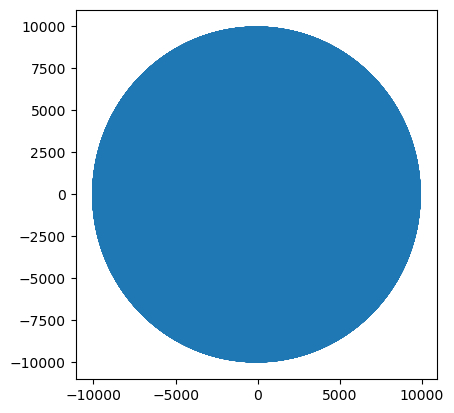

In [136]:
base_lima.buffered.plot()

<AxesSubplot:>

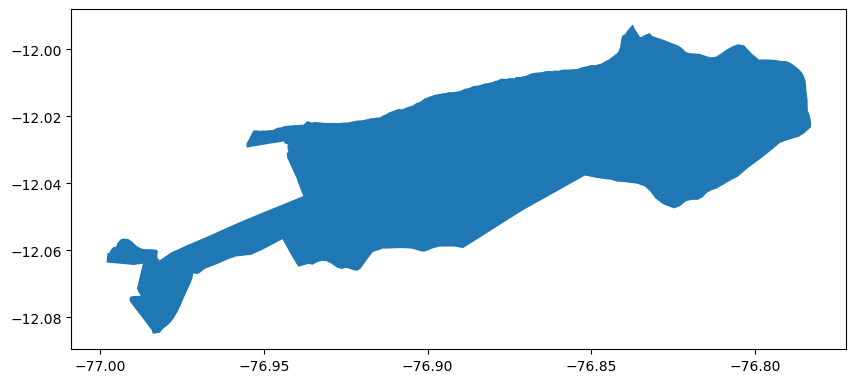

In [137]:
ATE = base_lima[base_lima.UBIGEO == 150103]
ATE.plot(figsize=(10, 10))

<AxesSubplot:>

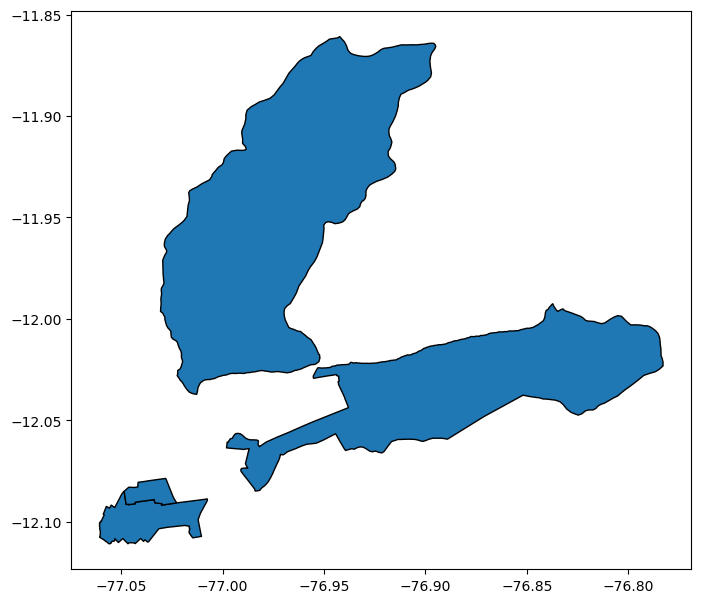

In [138]:
#Plot selectec districs 

ATE = base_lima.loc["ATE", "geometry"]
SJL = base_lima.loc["SAN JUAN DE LURIGANCHO", "geometry"]
SI = base_lima.loc["SAN ISIDRO", "geometry"]
LC = base_lima.loc["LINCE", "geometry"]

gpd.GeoSeries([ATE,SJL,SI,LC]).plot(figsize=(8, 8),linestyle='-',
                                    edgecolor='black')

## Limits - Boarders

In [139]:
# Logic operations:

# Lince and San Isidro share limits 

LC.touches(SI)

True

In [80]:
LC.touches(ATE)

False

In [215]:
#Distance ATE y (SAN ISIDRO, LINCE)

ATE.distance(SI)

0.021430816237973403

<AxesSubplot:>

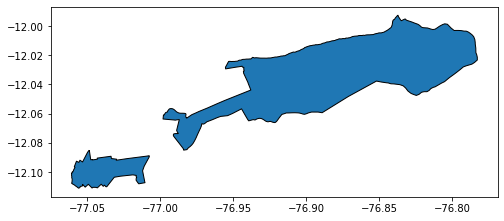

In [217]:
gpd.GeoSeries([ATE, SI]).plot(figsize=(8, 8),linestyle='-',
                                    edgecolor='black')

In [216]:
ATE.distance(LC)

0.03353670040995021

In [218]:
# Add line that cross Lince and ATE

ate_point = base_lima['centroid']['ATE']
lc_point = base_lima['centroid']['LINCE']
sb_point = base_lima['centroid']['SAN BORJA']
lr_point = base_lima['centroid']['LURIN']
ac_point = base_lima['centroid']['ANCON']


<AxesSubplot:>

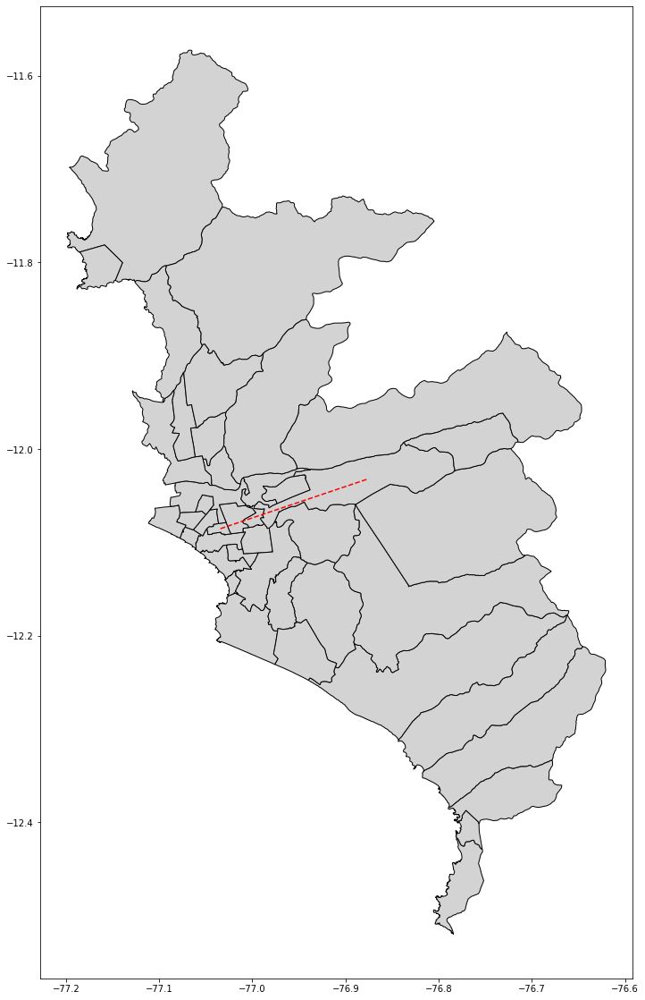

In [219]:
# Add line that cross Lince and ATE

ate_lince = LineString(zip((ate_point.x , lc_point.x ), (ate_point.y, lc_point.y)))

fig, ax = plt.subplots(figsize=(20,20))
base_lima.plot(color='lightgray', ax=ax, linestyle='-',
                                    edgecolor='black')

gpd.GeoSeries([ate_lince]).plot(color='red', linestyle='--', ax = ax)

In [144]:
base_lima['area']=base_lima.area
base_lima

C:\Users\DELL\AppData\Local\Temp\ipykernel_20856\3468981840.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima['area']=base_lima.area


,UBIGEO,geometry,Departamento,Provincia,Mes,Año,Casos,Muertes Covid,Muertes totales,centroid,buffered,area,distance
Distrito,,,,,,,,,,,,,
LURIN,150119,"POLYGON ((-76.70549 -12.17672, -76.70429 -12.1...",LIMA,LIMA,8,2020,452,29,68,POINT (-76.80111 -12.23426),"POLYGON ((-907.44458 9940.34876, -908.51450 99...",0.015586,0.334878
ANCON,150102,"POLYGON ((-77.06517 -11.57512, -77.06505 -11.5...",LIMA,LIMA,8,2020,460,30,51,POINT (-77.09581 -11.70253),"POLYGON ((-10070.83398 214.65757, -10071.54511...",0.025751,0.273336
SAN ISIDRO,150131,"POLYGON ((-77.04859 -12.08504, -77.04762 -12.0...",LIMA,LIMA,8,2020,551,30,86,POINT (-77.03667 -12.09898),"POLYGON ((-6569.98336 7593.29451, -5804.27878 ...",0.000805,0.166317
MAGDALENA DEL MAR,150120,"POLYGON ((-77.07210 -12.08358, -77.06348 -12.0...",LIMA,LIMA,8,2020,478,49,94,POINT (-77.06669 -12.09384),"POLYGON ((-6950.49655 7251.25149, -6191.31465 ...",0.000271,0.175867
SAN BORJA,150130,"POLYGON ((-76.98732 -12.07994, -76.98425 -12.0...",LIMA,LIMA,8,2020,1012,54,123,POINT (-76.99521 -12.09755),"POLYGON ((-1770.66790 9843.44877, -791.27992 9...",0.000860,0.153424
LINCE,150116,"POLYGON ((-77.02807 -12.07871, -77.02435 -12.0...",LIMA,LIMA,8,2020,855,76,129,POINT (-77.03567 -12.08579),"POLYGON ((-1448.68595 9893.40233, -503.73208 9...",0.000228,0.153848
SANTIAGO DE SURCO,150140,"POLYGON ((-76.95923 -12.07576, -76.95831 -12.0...",LIMA,LIMA,8,2020,2628,171,394,POINT (-76.98431 -12.12699),"POLYGON ((-3326.57958 9440.77630, -3327.93789 ...",0.002882,0.181479
PUEBLO LIBRE,150121,"POLYGON ((-77.04966 -12.07025, -77.05097 -12.0...",LIMA,LIMA,8,2020,633,61,140,POINT (-77.06574 -12.07508),"POLYGON ((6246.29993 7734.88076, 6978.22097 70...",0.000386,0.159857
SANTA ROSA,150139,"POLYGON ((-77.14355 -11.79587, -77.14061 -11.7...",LIMA,LIMA,8,2020,114,9,15,POINT (-77.16325 -11.80501),"POLYGON ((6739.98962 7295.68218, 6744.33819 73...",0.001446,0.237993


In [145]:
#Distamce between San Juan de Lurigancho to other districs 

SJL_point = base_lima['centroid']["SAN JUAN DE LURIGANCHO"]
    
base_lima['distance'] = base_lima['centroid'].distance(SJL_point)

C:\Users\DELL\AppData\Local\Temp\ipykernel_20856\3552139678.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  base_lima['distance'] = base_lima['centroid'].distance(SJL_point)


In [146]:
base_lima['distance'].sort_values(ascending=False)

Distrito
PUCUSANA                   0.555547
SANTA MARIA DEL MAR        0.505632
SAN BARTOLO                0.490367
PUNTA NEGRA                0.443395
PUNTA HERMOSA              0.395445
LURIN                      0.334878
VILLA EL SALVADOR          0.274567
ANCON                      0.273336
PACHACAMAC                 0.268347
CHORRILLOS                 0.249065
SANTA ROSA                 0.237993
CIENEGUILLA                0.233781
VILLA MARIA DEL TRIUNFO    0.230486
SAN JUAN DE MIRAFLORES     0.211952
CHACLACAYO                 0.209580
BARRANCO                   0.204123
MIRAFLORES                 0.184133
SANTIAGO DE SURCO          0.181479
SAN MIGUEL                 0.176307
MAGDALENA DEL MAR          0.175867
SURQUILLO                  0.172533
LURIGANCHO                 0.170624
SAN ISIDRO                 0.166317
PUEBLO LIBRE               0.159857
LINCE                      0.153848
SAN BORJA                  0.153424
JESUS MARIA                0.152794
LA MOLINA          

<AxesSubplot:xlabel='Distrito'>

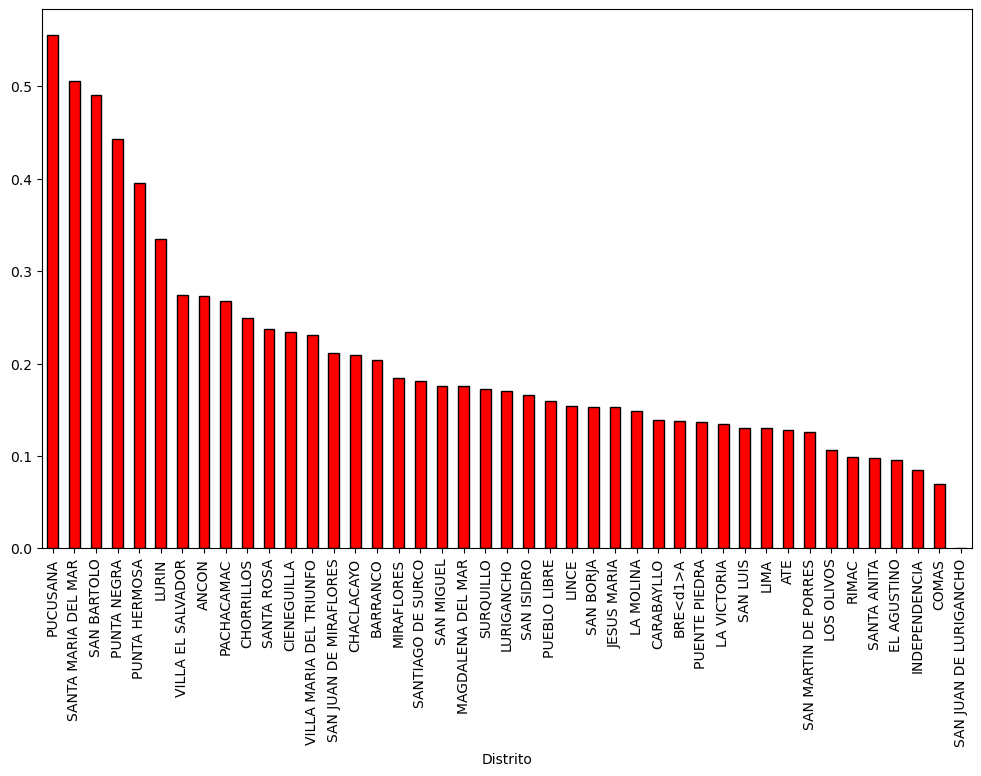

In [147]:

base_lima['distance'].sort_values(ascending=False).plot.bar(figsize=(12, 7), color = 'red', edgecolor='black')

In [148]:
ate_point.type

NameError: name 'ate_point' is not defined

In [ ]:
# SJL and other districs 

d1 = LineString(zip((SJL_point.x , lc_point.x ), (SJL_point.y, lc_point.y)))
d2 = LineString(zip((SJL_point.x , ate_point.x ), (SJL_point.y, ate_point.y)))
d3 = LineString(zip((SJL_point.x , sb_point.x ), (SJL_point.y, sb_point.y)))
d4 = LineString(zip((SJL_point.x , lr_point.x ), (SJL_point.y, lr_point.y)))
d5 = LineString(zip((SJL_point.x , ac_point.x ), (SJL_point.y, ac_point.y)))

fig, ax = plt.subplots(figsize=(20,20))
base_lima.plot(color='white', ax=ax, linestyle='-',
                                    edgecolor='black')

for i in range(1,6):
    gpd.GeoSeries(globals()[f'd{i}']).plot(color='red', linestyle='--', ax = ax, linewidth = 2.5)



## ArcGis Operations in Geopandas

In [149]:
dist_shp = gpd.read_file(r'../_data/shape_file/DISTRITOS.shp')

### Get Centroids
Get the centroids of each geometry (district).

In [150]:
dist_shp.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [151]:
dist_shp.to_crs(24891).centroid.to_crs( 4326 )

0        POINT (-75.46643 -9.63426)
1        POINT (-74.86630 -9.00133)
2        POINT (-75.04801 -8.82493)
3        POINT (-75.27987 -8.95039)
4        POINT (-75.04902 -8.64129)
                   ...             
1868     POINT (-76.03798 -9.20808)
1869     POINT (-76.00134 -9.08221)
1870     POINT (-75.98295 -8.98489)
1871    POINT (-70.12642 -15.40623)
1872    POINT (-77.44521 -11.00357)
Length: 1873, dtype: geometry

In [152]:
dist_shp.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

We get warnings since we need to reproject this shapefile object to a CRS in meters. This CRS should be a plane area to the specific zone of the shapefile ([more info](https://stackoverflow.com/questions/63004400/getting-a-userwarning-when-calculating-centroid-of-a-geoseries)). In the case of Peru, we use 24891 ([more info](https://epsg.io/24891)).



In [153]:
projected_dist_shp = dist_shp.to_crs( epsg = 24891 )

projected_dist_shp[ 'centroids'] = projected_dist_shp.centroid

Then, we reproject again the centroids to the original CRS.

In [154]:
dist_shp[ 'Centroid_Latitude' ] = projected_dist_shp[ 'centroids' ].to_crs( epsg = 4326 ).y
dist_shp[ 'Centroid_Longitude' ] = projected_dist_shp[ 'centroids' ].to_crs( epsg = 4326 ).x

## Intersection

In [155]:
health_centers = pd.read_csv( r"../_data\salud_places_peru.csv")

In [156]:
ht1 = health_centers[ health_centers.latitud != 0 ]

In [157]:
# Make ht1 a geopandas
ht1_geo = gpd.GeoDataFrame( ht1 , 
                           geometry= gpd.points_from_xy( 
                                      ht1.longitud, 
                                      ht1.latitud))

Check CRS

We found that geolocation is recognized by google maps. We set the CRS that correspond to google maps.

In [158]:
ht1_geo_crs = ht1_geo.set_crs( epsg = 4326 )

Find Ubigeo for each point

In [159]:
# Just take 10% of observations
ht2_geo = ht1_geo_crs.sample( frac = 0.10 )

In [160]:
# Intersect with maps
intersected_ht = gpd.overlay( ht2_geo , maps , how = 'intersection' )

In [161]:
ht2_geo.columns

Index(['id_eess', 'codigo_renaes', 'categoria', 'nombre', 'diresa', 'red',
       'direccion', 'longitud', 'latitud', 'id_ubigeo', 'geometry'],
      dtype='object')

In [162]:
intersected_ht

,id_eess,codigo_renaes,categoria,nombre,diresa,red,direccion,longitud,latitud,id_ubigeo,UBIGEO,geometry
0,10033,19335,I-3,POLICLINICO BANDA SHILCAYO,SAN MARTIN,NO PERTENECE A NINGUNA RED,JIRÓN JIRON TARAPOTO 382 BANDA DE SHILCAYO DIS...,-76.346362,-6.492716,1807,220909,POINT (-76.34636 -6.49272)
1,11895,6367,I-1,LA UNION (SANIRARCA),SAN MARTIN,SAN MARTIN,AVENIDA LA UNION ACSERIO LA UNION AV. LA UNION...,-76.304616,-6.504808,1807,220909,POINT (-76.30462 -6.50481)
2,12117,18667,II-E,CLINICA ARROYO,LIMA DIRIS CENTRO,NO PERTENECE A NINGUNA RED,AVENIDA AV. PABLO CARRIQUIRY 798 CORPAC SAN IS...,-77.018614,-12.099788,1311,150131,POINT (-77.01861 -12.09979)
3,20464,17172,I-3,IMM S.A.C.,LIMA DIRIS CENTRO,NO PERTENECE A NINGUNA RED,AVENIDA AV. JAVIER PRADO ESTE 1476 DISTRITO SA...,-77.011404,-12.089537,1311,150131,POINT (-77.01140 -12.08954)
4,23555,28906,I-1,CONSULTORIO ODONTOLOGICO FRANCESQUI,LIMA DIRIS CENTRO,NO PERTENECE A NINGUNA RED,AVENIDA PAZ SOLDAN 170 INT 601 606 DISTRITO SA...,-77.033371,-12.097050,1311,150131,POINT (-77.03337 -12.09705)
...,...,...,...,...,...,...,...,...,...,...,...,...
1539,9567,488,I-1,SAN ANDRES,JUNIN,SATIPO,OTROS COMUNIDAD SAN ANDRES DISTRITO COVIRIALI ...,-74.688297,-11.329232,1124,120602,POINT (-74.68830 -11.32923)
1540,2222,28935,I-1,SHIPETIARI,MADRE DE DIOS,MADRE DE DIOS,CAMINO RURAL Comunidad Shipetiari DISTRITO MAN...,-70.908723,-12.252546,1510,170202,POINT (-70.90872 -12.25255)
1541,27640,28541,SD,"LABORATORIO DE ANÁLISIS CLÍNICO ""VIRGEN DE LOU...",LAMBAYEQUE,NO PERTENECE A NINGUNA RED,JIRÓN CONQUISTA NÚMERO 360 DISTRITO JOSE LEONA...,-79.836558,-6.760543,1247,140105,POINT (-79.83656 -6.76054)
1542,16383,5296,II-1,HOSPITAL DISTRITAL DE PACASMAYO,LA LIBERTAD,RED PACASMAYO,JIRÓN JIRON RAZURI S/N S/N JIRON RAZURI S/N PA...,-79.569327,-7.398782,1205,130704,POINT (-79.56933 -7.39878)


## Aggregation

We have shapefiles at district levels. It is possible to aggregate districts at Department or Province level.

<AxesSubplot:>

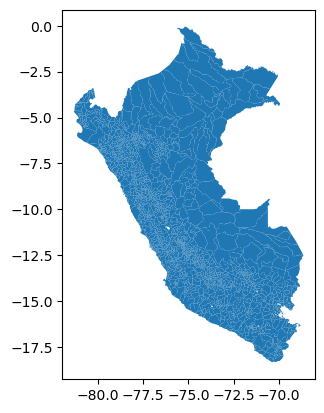

In [163]:
dist_shp.plot()

In [164]:
prov_shp = dist_shp.dissolve( by = 'IDPROV' )

<AxesSubplot:>

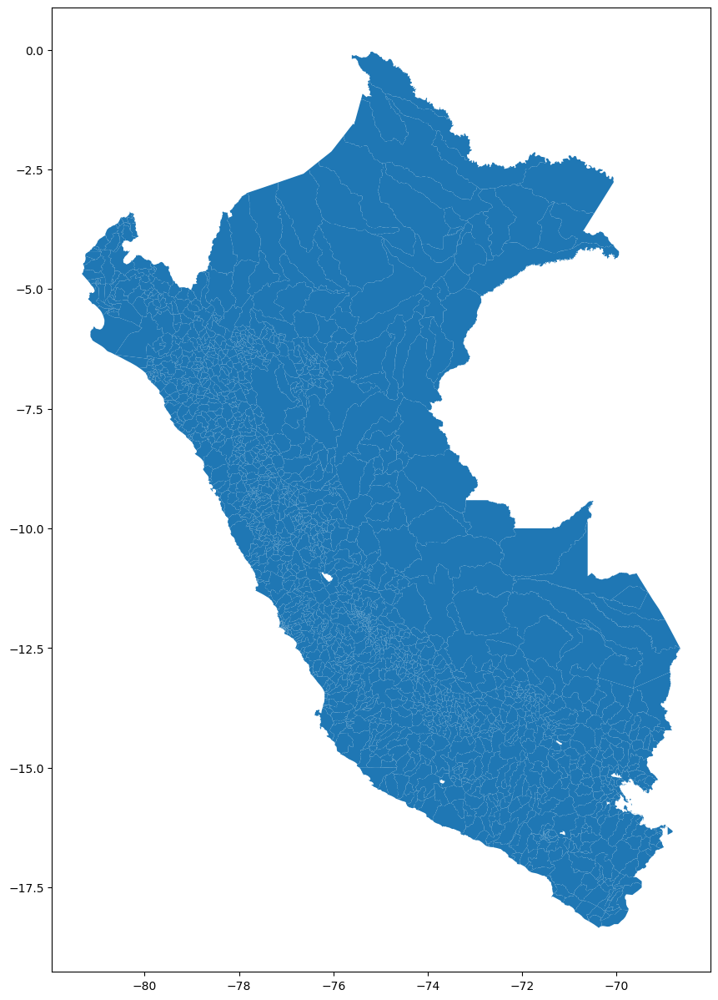

In [165]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
dist_shp.plot( ax = ax )

<AxesSubplot:>

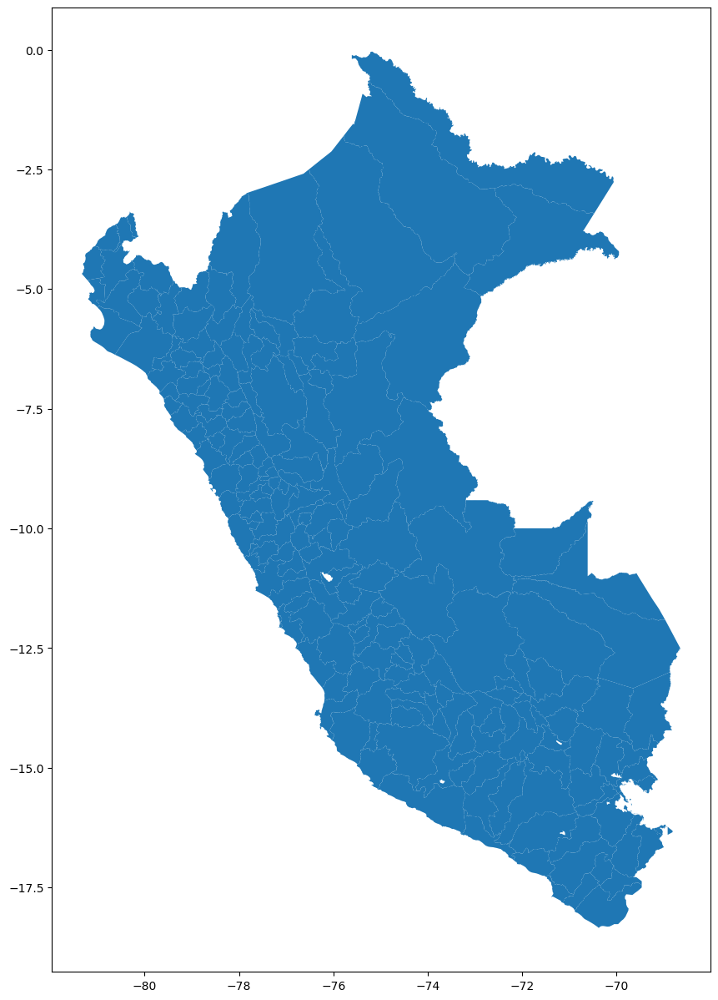

In [166]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
prov_shp.plot( ax = ax )

In [167]:
dpt_shp = dist_shp.dissolve( by = 'IDDPTO' )

<AxesSubplot:>

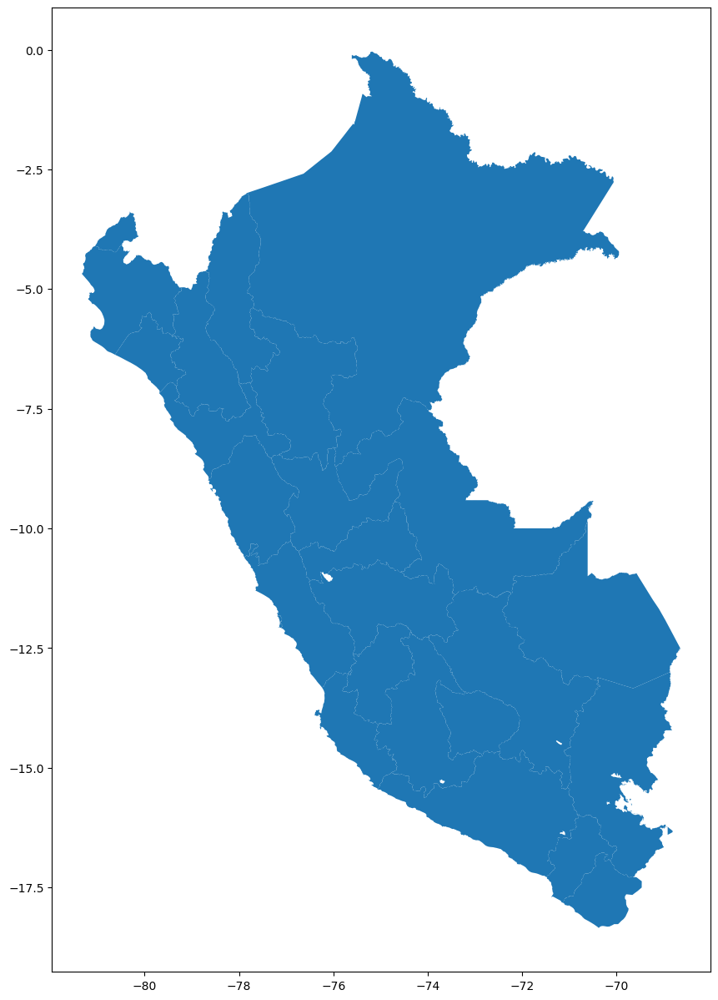

In [168]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
dpt_shp.plot( ax = ax )

<AxesSubplot:>

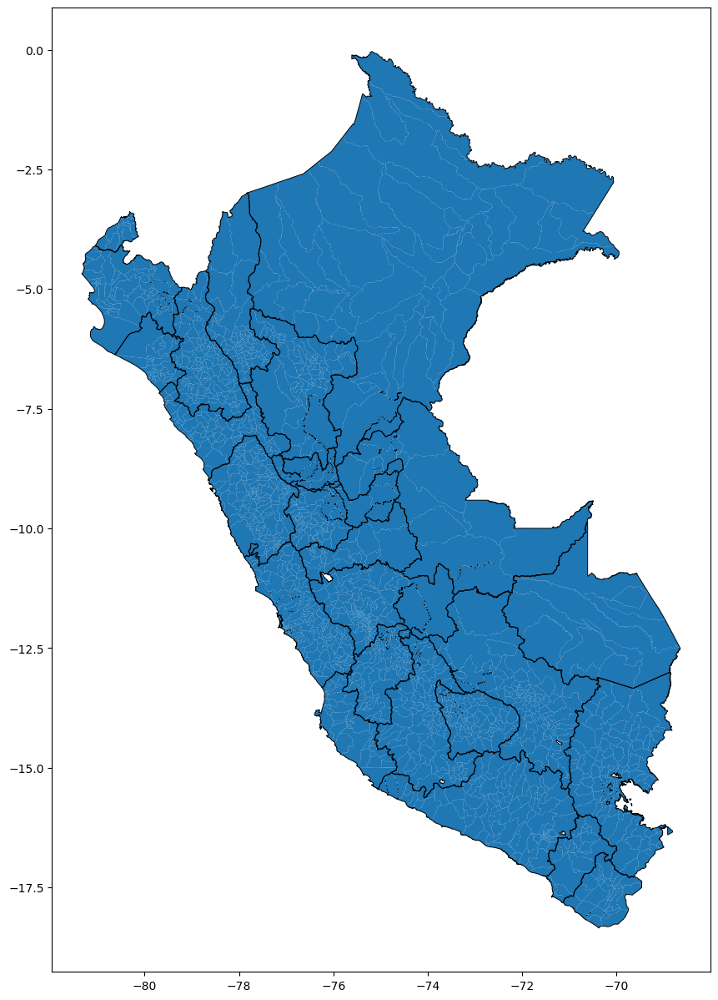

In [169]:
fig, ax = plt.subplots( figsize = ( 12, 15 ) )
dist_shp.plot( ax = ax )
dpt_shp.plot( ax = ax, facecolor="none",  edgecolor='black', lw=0.7 )

## Checking CRS

In [170]:
# Border of Switzerland
ch_borders = gpd.read_file( r'../_data/eu_maps/CHE_adm0.shp')

# Border of Germany
de_borders = gpd.read_file( r'../_data/eu_maps/gadm36_DEU_0.shp')

# Switzerland lakes shape files
ch_lakes = gpd.GeoDataFrame.from_file( r'../_data/eu_maps/g2s15.shp')

# muni
Geo_muni = gpd.read_file( r"../_data/eu_maps/VG250_GEM.shp" )

Plots with different CRS

(-46058.36469219931, 967356.691928138, -305024.0777151486, 6406513.607306512)

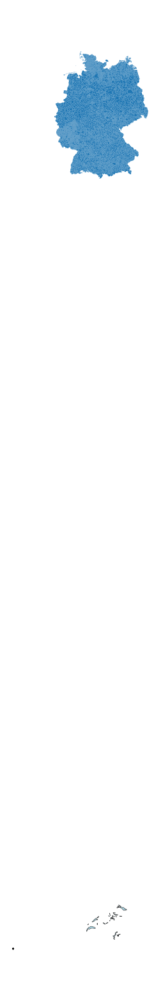

In [171]:

fig = plt.figure(figsize=(40, 20), dpi=100)
ax = fig.add_subplot(111, frame_on = False )

# German Plot
Geo_muni.plot( ax = ax )

# switzerland borders
ch_borders.geometry.boundary.plot(color = 'black', ax=ax, edgecolor='0.2', linewidth=1.5) 

# # Swiss lakes
ch_lakes.plot(color='lightblue' , ax=ax, edgecolor='0.2', linewidth=0.4, legend=True)

ax.axis('off')

# # define coordinates for the plot area
# ax.set_xlim(455869.5728, 927076.5648)
# #ax.set_ylim( auto = True)
# ax.set_ylim(60443.1884, 529941.7864)

# Save in pdf
# plt.savefig('maps/inventors_BW_bar_legend.pdf')


Check CRS

In [172]:
shp_files = [ ch_borders, de_borders, ch_lakes, Geo_muni ]

In [173]:
for shp in shp_files:
    print( shp.crs )
    
#cada informacion esta por su CRS, debe cambiarse

epsg:4326
epsg:4326
epsg:21781
epsg:25832


Reproject CRS

In [177]:
Geo_muni_crs = Geo_muni.to_crs( 21781 )

In [175]:
ch_borders_crs = ch_borders.to_crs( 21781 )

(453126.0049465788, 1163640.4776774019, 11798.918320549732, 1157415.473468453)

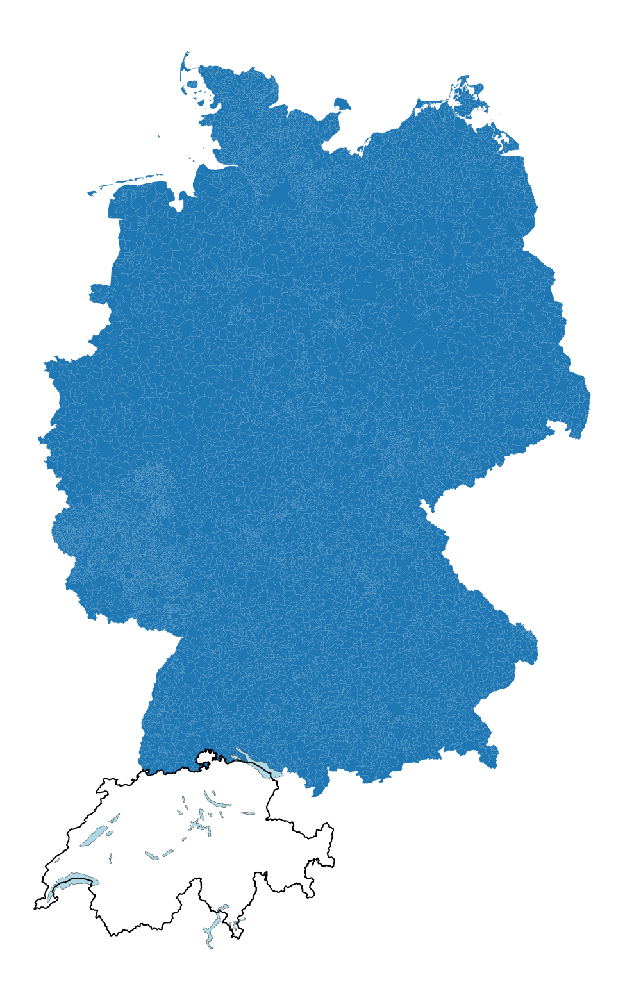

In [176]:

fig = plt.figure(figsize=(40, 20), dpi=100)
ax = fig.add_subplot(111, frame_on = False )

# German Plot
Geo_muni_crs.plot( ax = ax )

# switzerland borders
ch_borders_crs.geometry.boundary.plot(color = 'black', ax=ax, edgecolor='0.2', linewidth=1.5) 

# # Swiss lakes
ch_lakes.plot(color='lightblue' , ax=ax, edgecolor='0.2', linewidth=0.4, legend=True)

ax.axis('off')

# # define coordinates for the plot area
# ax.set_xlim(455869.5728, 927076.5648)
#ax.set_ylim( auto = True)
# ax.set_ylim(60443.1884, 529941.7864)

# Save in pdf
# plt.savefig('maps/inventors_BW_bar_legend.pdf')


## References:


### Geopandas
https://geopandas.org/en/stable/docs/user_guide/set_operations.html

https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html

https://geopandas.org/en/stable/docs/user_guide/data_structures.html

https://www.kaggle.com/imdevskp/geopandas

### Coordinate Reference System

https://geopandas.org/en/stable/docs/user_guide/projections.html

#### Types of projections

https://spatialreference.org/

#### Universal Transverse Mercator (UTM)

https://manifold.net/doc/mfd9/universal_transverse_mercator_projection.htm

